**Authors:** "Anish Bhandari, Will Jones, Nicholas Sager"

In [33]:
knitr::opts_chunk$set(echo = TRUE, warning=FALSE, message=FALSE)
# added the line just for testing - Anish Bhandari
# Required Libraries
library(tidyverse)
library(knitr)
library(kableExtra)
library(ggthemes)
library(caret)
library(janitor)
library(doParallel)

#library(e1071)
#library(class)

## Introduction

In the dynamic field of data science, modeling serves as a vital tool for comprehending and predicting intricate relationships among variables. In this project, we will undertake a comprehensive exploration encompassing data processing, exploratory data analysis, and model construction. Our primary objective is to construct robust and reliable models that offer valuable insights and demonstrate accurate predictive capabilities. The initial model will prioritize interpretability, enabling us to extract meaningful explanations. Subsequently, we will develop two additional models that emphasize accurate predictions.

The video presentation for this project can be found at: <https://youtu.be/_Rdo4PIEZZI>

## Data Description

Kaggle is used by data scientists and machine learning engineers to discover data, build models, and compete in challenges. One of the most popular competitions in Kaggle is 'House Prices - Advanced Regression Techniques'. As of 6/6/2023, this competition has close to 28K entries.

The Ames Housing dataset was compiled by Dean De Cock and can be found in the link below. There are 2 files - train.csv and a test.csv. Both the datasets have 79 explanatory variables. Sales price is the response variable which is present in train and absent in test. The train dataset has 1460 unique rows and test dataset has 1459 unique rows.For the purpose of our modeling exercise, we will solely utilize the train dataset. However, we have included the test dataset to facilitate the assessment of predictive performance using Kaggle prediction scores.

Dataset Link: <https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data>

### Read the Data

In [34]:
# train <- read.csv("https://raw.githubusercontent.com/NickSager/DS_6372_Ames2/master/Data/train.csv")
# test<- read.csv("https://raw.githubusercontent.com/NickSager/DS_6372_Ames2/master/Data/test.csv")

train <- read.csv("Data/train.csv")
test<- read.csv("Data/test.csv")

# Merge the data frames and add a column indicating whether they come from the train or test set
train$train <- 1
test$SalePrice <- NA
test$train <- 0
ames <- rbind(train, test)

# Verify data frame
head(ames)
str(ames)
summary(ames)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,⋯,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,train
,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<dbl>
1,1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,⋯,NA,NA,NA,0,2,2008,WD,Normal,208500,1
2,2,20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,⋯,NA,NA,NA,0,5,2007,WD,Normal,181500,1
3,3,60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,⋯,NA,NA,NA,0,9,2008,WD,Normal,223500,1
4,4,70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,⋯,NA,NA,NA,0,2,2006,WD,Abnorml,140000,1
5,5,60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,⋯,NA,NA,NA,0,12,2008,WD,Normal,250000,1
6,6,50,RL,85,14115,Pave,NA,IR1,Lvl,AllPub,⋯,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000,1


'data.frame':	2919 obs. of  82 variables:
 $ Id           : int  1 2 3 4 5 6 7 8 9 10 ...
 $ MSSubClass   : int  60 20 60 70 60 50 20 60 50 190 ...
 $ MSZoning     : chr  "RL" "RL" "RL" "RL" ...
 $ LotFrontage  : int  65 80 68 60 84 85 75 NA 51 50 ...
 $ LotArea      : int  8450 9600 11250 9550 14260 14115 10084 10382 6120 7420 ...
 $ Street       : chr  "Pave" "Pave" "Pave" "Pave" ...
 $ Alley        : chr  NA NA NA NA ...
 $ LotShape     : chr  "Reg" "Reg" "IR1" "IR1" ...
 $ LandContour  : chr  "Lvl" "Lvl" "Lvl" "Lvl" ...
 $ Utilities    : chr  "AllPub" "AllPub" "AllPub" "AllPub" ...
 $ LotConfig    : chr  "Inside" "FR2" "Inside" "Corner" ...
 $ LandSlope    : chr  "Gtl" "Gtl" "Gtl" "Gtl" ...
 $ Neighborhood : chr  "CollgCr" "Veenker" "CollgCr" "Crawfor" ...
 $ Condition1   : chr  "Norm" "Feedr" "Norm" "Norm" ...
 $ Condition2   : chr  "Norm" "Norm" "Norm" "Norm" ...
 $ BldgType     : chr  "1Fam" "1Fam" "1Fam" "1Fam" ...
 $ HouseStyle   : chr  "2Story" "1Story" "2Story" "2Story" ...


       Id           MSSubClass       MSZoning          LotFrontage    
 Min.   :   1.0   Min.   : 20.00   Length:2919        Min.   : 21.00  
 1st Qu.: 730.5   1st Qu.: 20.00   Class :character   1st Qu.: 59.00  
 Median :1460.0   Median : 50.00   Mode  :character   Median : 68.00  
 Mean   :1460.0   Mean   : 57.14                      Mean   : 69.31  
 3rd Qu.:2189.5   3rd Qu.: 70.00                      3rd Qu.: 80.00  
 Max.   :2919.0   Max.   :190.00                      Max.   :313.00  
                                                      NA's   :486     
    LotArea          Street             Alley             LotShape        
 Min.   :  1300   Length:2919        Length:2919        Length:2919       
 1st Qu.:  7478   Class :character   Class :character   Class :character  
 Median :  9453   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 10168                                                           
 3rd Qu.: 11570                                          

For data cleaning purposes, we will merge test and train into one dataset, keeping in mind that the 1459 NA's in the SalePrice column are from the test set. We will also add a column to indicate whether the row is from the train or test set.

### Data Cleaning 

In order to use a linear regression model, we need to convert all of the categorical variables into dummy variables. We will also remove or impute the NA's in the data set.


Column,NA_Count
<chr>,<int>
PoolQC,2909
MiscFeature,2814
Alley,2721
Fence,2348
SalePrice,1459
FireplaceQu,1420
LotFrontage,486
GarageYrBlt,159
GarageFinish,159


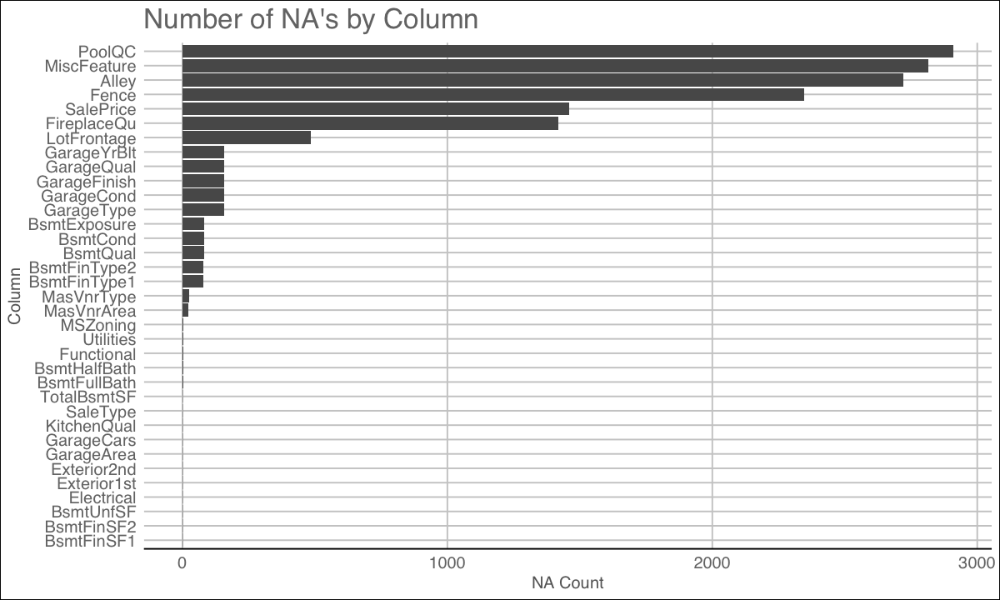

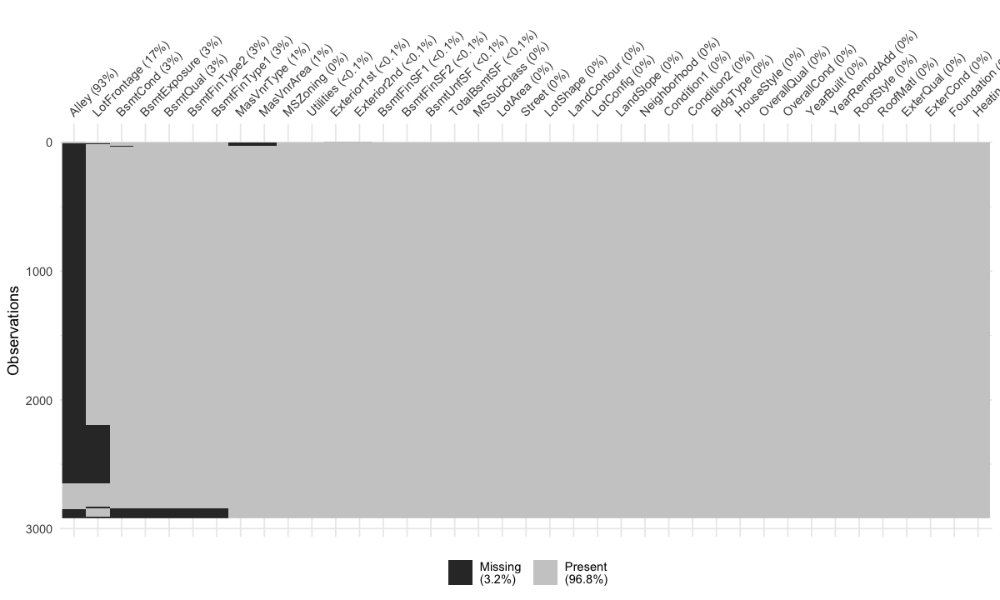

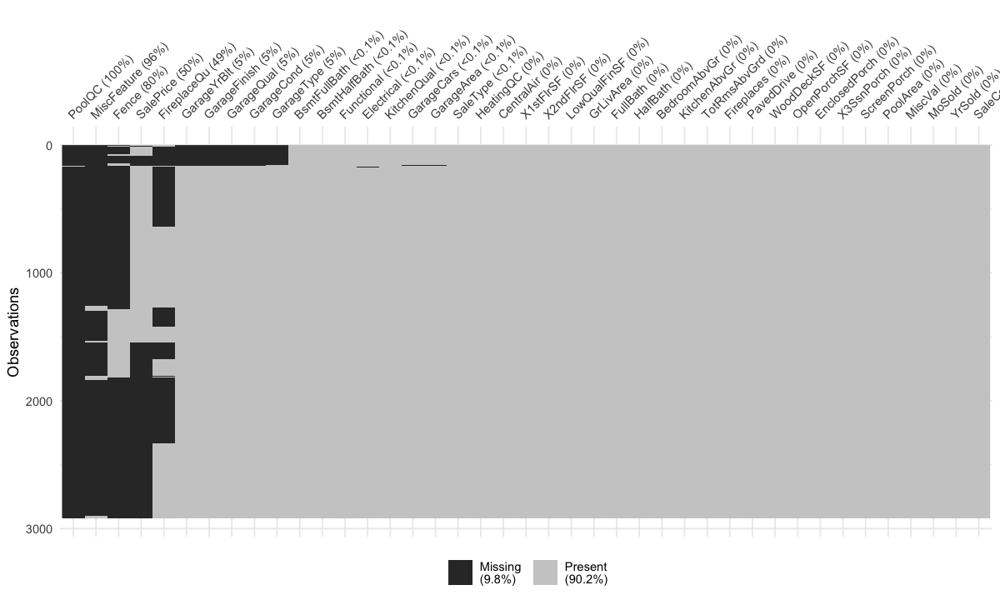

In [35]:
# Summarize NA's by  column
ames %>%
  summarise_all(~(sum(is.na(.)))) %>%
  gather(key = "Column", value = "NA_Count", -1) %>%
  filter(NA_Count > 0) %>%
  ggplot(aes(x = reorder(Column, NA_Count), y = NA_Count)) +
  geom_col() +
  coord_flip() +
  theme_gdocs() +
  labs(title = "Number of NA's by Column", x = "Column", y = "NA Count")

# Create a table of the missing NAs by column
ames %>%
  summarise_all(~(sum(is.na(.)))) %>%
  gather(key = "Column", value = "NA_Count", -1) %>%
  filter(NA_Count > 0) %>%
  arrange(desc(NA_Count)) %>%
  select(-Id) # %>% 
  # kable()



library(naniar)
vis_miss(ames[c(2:40)],cluster = TRUE, sort_miss =TRUE)
vis_miss(ames[c(41:81)],cluster = TRUE, sort_miss = TRUE)

There are not too many NA's in the data set, and they appear mostly to do with lack of a certain feature. For example, if a house does not have a pool, then the PoolQC column will be NA.

Id    MSSubClass      MSZoning   LotFrontage       LotArea 
            0             0             4             0             0 
       Street         Alley      LotShape   LandContour     Utilities 
            0             0             0             0             0 
    LotConfig     LandSlope  Neighborhood    Condition1    Condition2 
            0             0             0             0             0 
     BldgType    HouseStyle   OverallQual   OverallCond     YearBuilt 
            0             0             0             0             0 
 YearRemodAdd     RoofStyle      RoofMatl   Exterior1st   Exterior2nd 
            0             0             0             0             0 
   MasVnrType    MasVnrArea     ExterQual     ExterCond    Foundation 
            0             0             0             0             0 
     BsmtQual      BsmtCond  BsmtExposure  BsmtFinType1    BsmtFinSF1 
            0             0             0             0             0 
 BsmtFinType2    BsmtFinSF2     BsmtUnfSF   TotalBsmtSF       Heating 
            0             0             0             0             0 
    HeatingQC    CentralAir    Electrical     X1stFlrSF     X2ndFlrSF 
            0             0             0             0             0 
 LowQualFinSF     GrLivArea  BsmtFullBath  BsmtHalfBath      FullBath 
            0             0             0             0             0 
     HalfBath  BedroomAbvGr  KitchenAbvGr   KitchenQual  TotRmsAbvGrd 
            0             0             0             1             0 
   Functional    Fireplaces   FireplaceQu    GarageType   GarageYrBlt 
            2             0             0             0             0 
 GarageFinish    GarageCars    GarageArea    GarageQual    GarageCond 
            0             0             0             0             0 
   PavedDrive    WoodDeckSF   OpenPorchSF EnclosedPorch    X3SsnPorch 
            0             0             0             0             0 
  ScreenPorch      PoolArea        PoolQC         Fence   MiscFeature 
            0             0             0             0             0 
      MiscVal        MoSold        YrSold      SaleType SaleCondition 
            0             0             0             1             0 
    SalePrice         train 
         1459             0

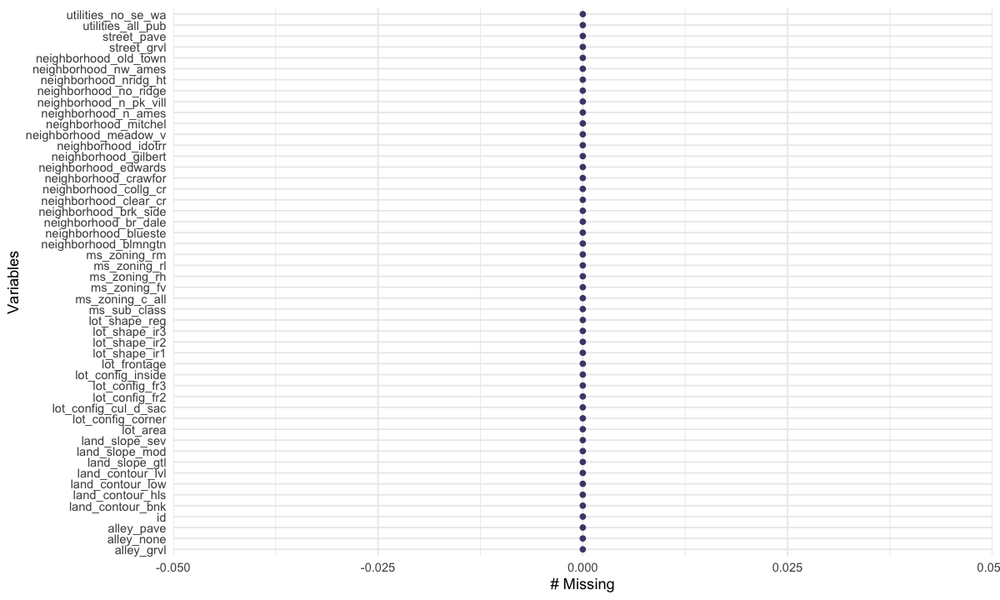

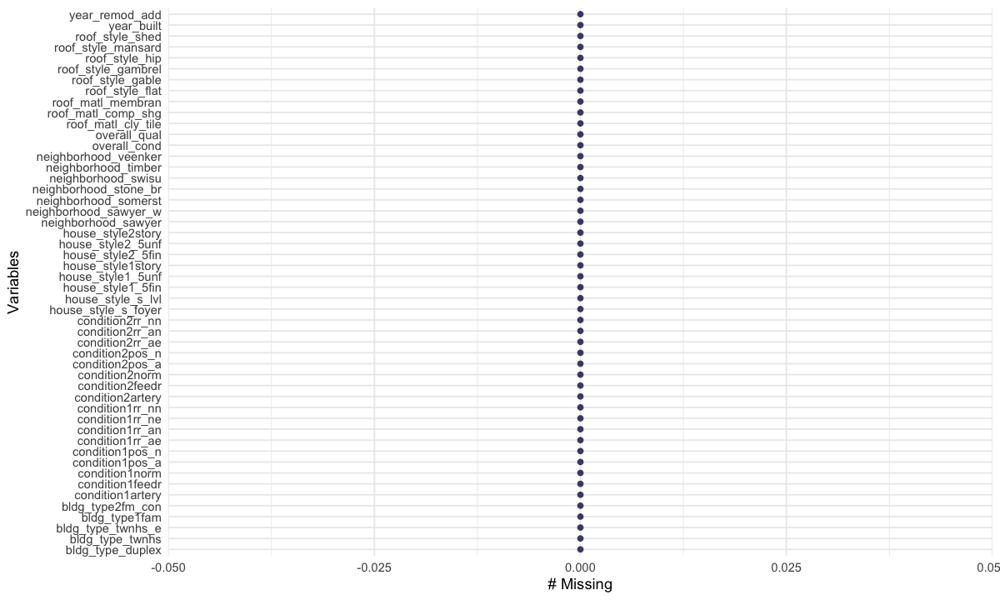

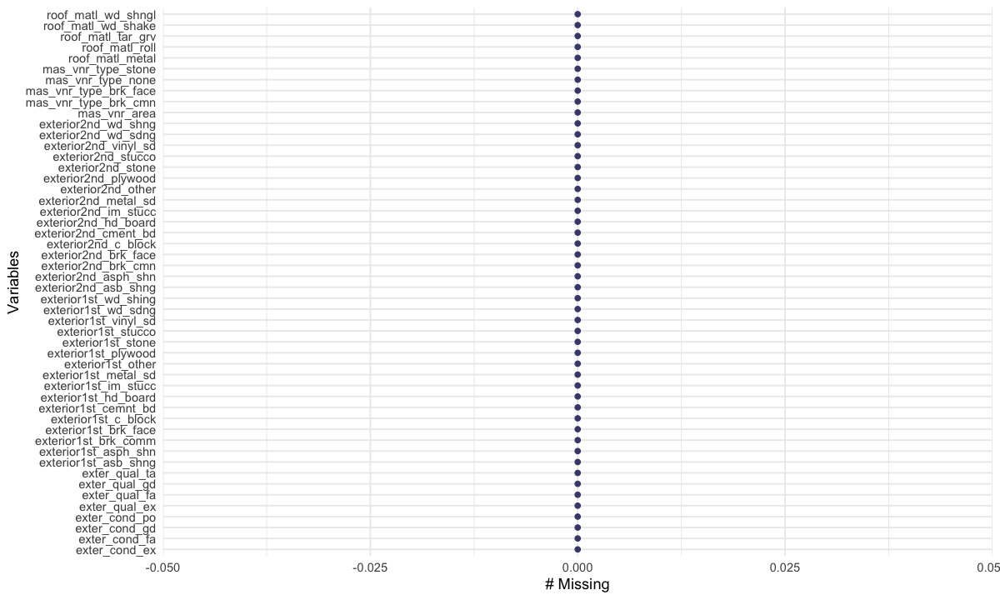

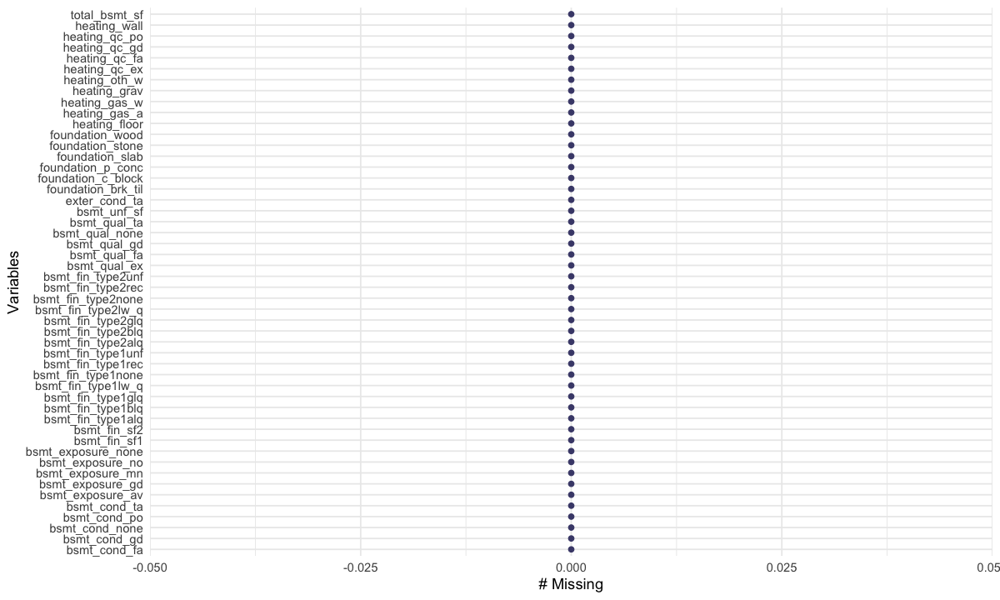

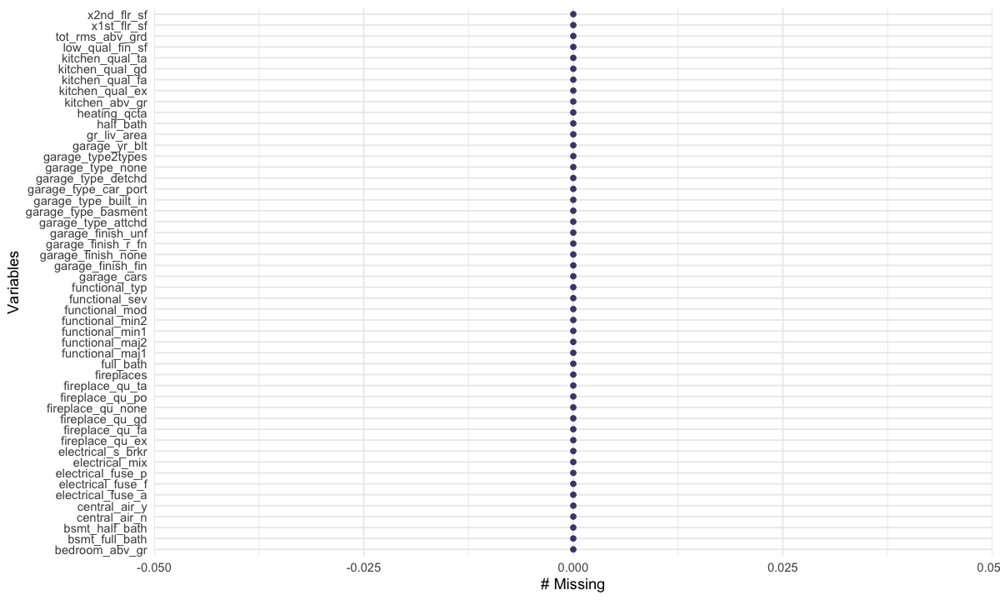

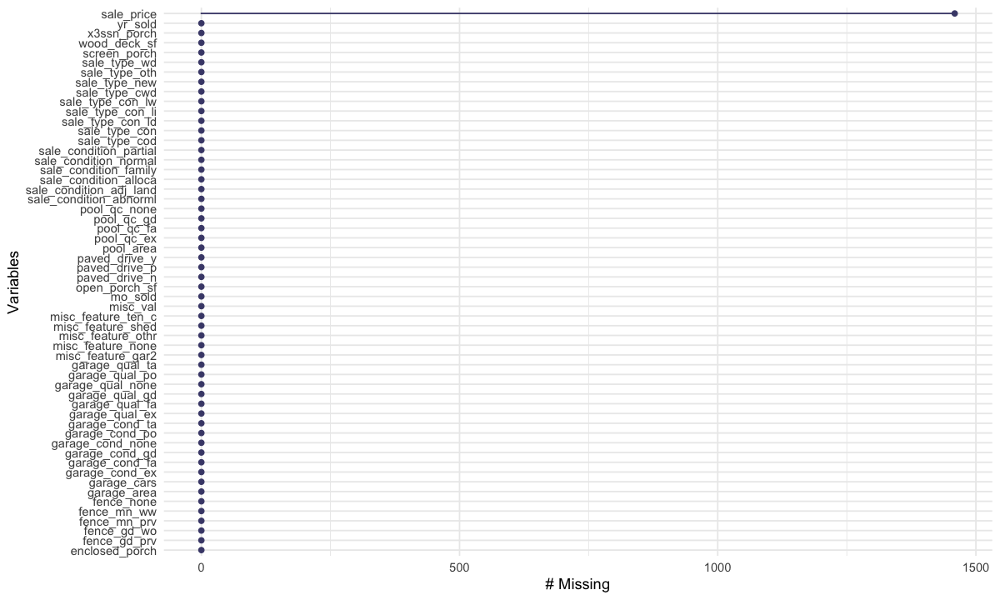

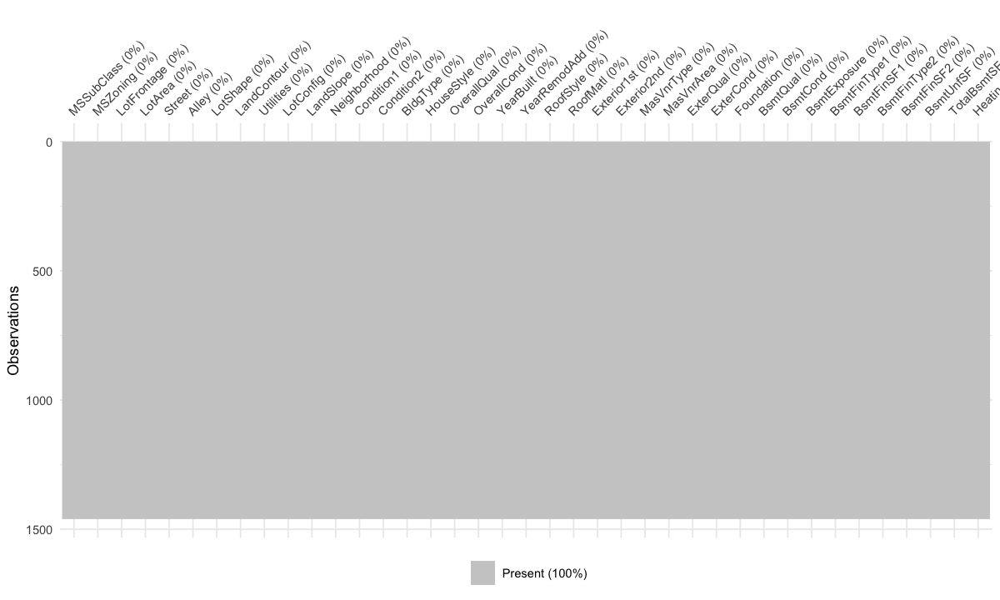

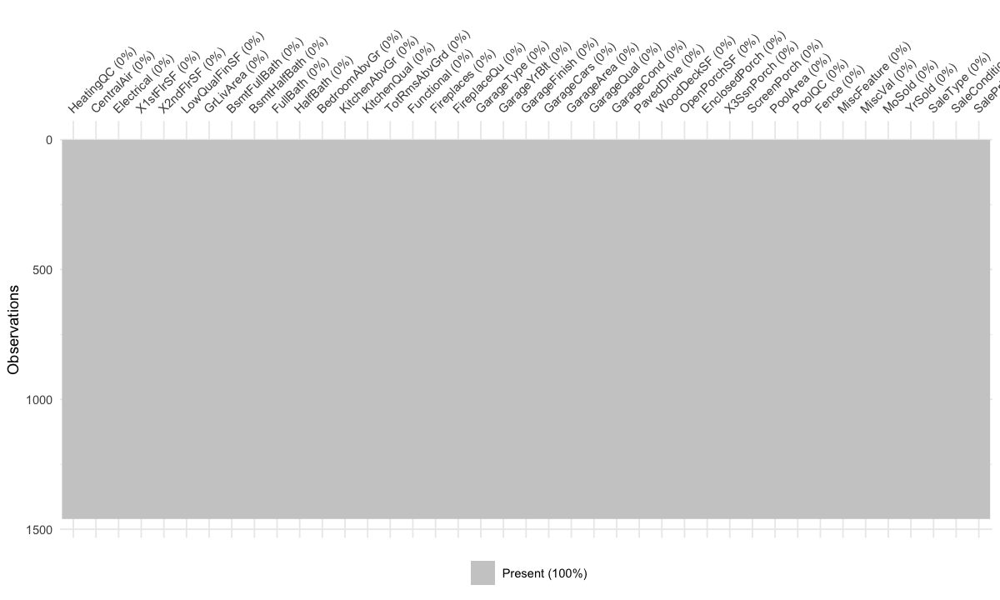

In [36]:
# Imputation

# If pool-related variables are NA, assume there is no pool and assign to 0
ames <- ames %>%
  mutate(
    PoolQC = ifelse(is.na(PoolQC), "None", PoolQC),
    PoolArea = ifelse(is.na(PoolArea), 0, PoolArea),
  )
# If garage-related variables are NA, assume there is no garage and assign to 0
ames <- ames %>%
  mutate(
    GarageType = ifelse(is.na(GarageType), "None", GarageType),
   GarageYrBlt = ifelse(is.na(GarageYrBlt), 1979, GarageYrBlt), #These will be changed to the mean because of large year values
    GarageFinish = ifelse(is.na(GarageFinish), "None", GarageFinish),
    GarageCars = ifelse(is.na(GarageCars), 0, GarageCars),
    GarageArea = ifelse(is.na(GarageArea), 0, GarageArea),
    GarageQual = ifelse(is.na(GarageQual), "None", GarageQual),
    GarageCond = ifelse(is.na(GarageCond), "None", GarageCond)
  )
# If Bsmt-related variables are NA, assume there is no Bsmt and assign to 0, Masvertype to 0, Utilities to All pub which is the most common, and Exterior to other
ames <- ames %>%
  mutate(
    BsmtQual = ifelse(is.na(BsmtQual), "None", BsmtQual),
    BsmtCond = ifelse(is.na(BsmtCond), "None", BsmtCond),
    BsmtExposure = ifelse(is.na(BsmtExposure), "None", BsmtExposure),
    BsmtFinType1 = ifelse(is.na(BsmtFinType1), "None", BsmtFinType1),
    BsmtFinSF1 = ifelse(is.na(BsmtFinSF1), 0, BsmtFinSF1),
    BsmtFinType2 = ifelse(is.na(BsmtFinType2), "None", BsmtFinType2),
    BsmtFinSF2 = ifelse(is.na(BsmtFinSF2), 0, BsmtFinSF2),
    BsmtUnfSF = ifelse(is.na(BsmtUnfSF), 0, BsmtUnfSF),
    BsmtFullBath = ifelse(is.na(BsmtFullBath), 0, BsmtFullBath),
    BsmtHalfBath = ifelse(is.na(BsmtHalfBath), 0, BsmtHalfBath),
    TotalBsmtSF = ifelse(is.na(TotalBsmtSF), 0, TotalBsmtSF),
    LotFrontage = ifelse(is.na(LotFrontage), 0, LotFrontage),
    MasVnrArea = ifelse(is.na(MasVnrArea), 0, MasVnrArea),
    MasVnrType = ifelse(is.na(MasVnrType), "None", MasVnrType),
    Utilities = ifelse(is.na(Utilities), "AllPub", Utilities),
    Exterior1st = ifelse(is.na(Exterior1st), "Other", Exterior1st),
    Exterior2nd = ifelse(is.na(Exterior2nd), "Other", Exterior2nd),
    Electrical = ifelse(is.na(Electrical), "FuseA", Electrical),
  )
# If Fence-related variables are NA, assume there is no Fence and assign to 0
ames <- ames %>%
  mutate(
    Fence = ifelse(is.na(Fence), "None", Fence), 
  )
# If Misc-related variables are NA, assume there is no Misc features and assign to 0
ames <- ames %>%
  mutate(
    MiscFeature = ifelse(is.na(MiscFeature), "None", MiscFeature), 
  )
# If Fireplace-related variables are NA, assume there is no Fireplace and assign to 0
ames <- ames %>%
  mutate(
    FireplaceQu = ifelse(is.na(FireplaceQu), "None", FireplaceQu),
  )
# If Alley-related variables are NA, assume there is no Alley and assign to 0
ames <- ames %>%
  mutate(
    Alley = ifelse(is.na(Alley), "None", Alley),
  )

# Summarize the amount of remaining NA's by column to check what's left
colSums(is.na(ames))

# create a dataset for eda named ameseda
ameseda <- ames[ames$train == 1, ]


# Use the dummyVars() function to convert categorical variables into dummy variables
# Then use janitor::clean_names() to clean up the column names
dummy_model <- dummyVars(~ ., data = ames)
ames_dummy <- as.data.frame(predict(dummy_model, newdata = ames))
ames_dummy <- clean_names(ames_dummy)

# NOTE: Probably could make the case for deleting NAs here -Nick
# Fill in all remaining na values with the mean of the column
ames_dummy <- ames_dummy %>%
  mutate(across(
    c(-sale_price) ,# , -train),
    ~ ifelse(is.na(.), mean(., na.rm = TRUE), .)
  ))

# create ames dataset for modeling to be consistent with team member's terminology
ames <-ames_dummy

# Summary of missing values post imputation and changing into dummy. Sales Price from the 'test' dataset is the only column with missing values. 

gg_miss_var(ames_dummy[,c(1:50)])
gg_miss_var(ames_dummy[,c(51:100)])
gg_miss_var(ames_dummy[,c(101:150)])
gg_miss_var(ames_dummy[,c(151:200)])
gg_miss_var(ames_dummy[,c(201:250)])
gg_miss_var(ames_dummy[,c(250:305)])




vis_miss(ameseda[c(2:40)],cluster = TRUE, sort_miss =TRUE)
vis_miss(ameseda[c(41:81)],cluster = TRUE, sort_miss = TRUE)

Imputation:

Pool related variables: Upon investigation, we discovered that the missing data for pool-related variables followed a MNAR (Missing Not at Random) pattern, specifically in homes without pools. To address this, we replaced the missing values with "none" or 0, depending on the variable type.

Garage related variables: Our investigation revealed that the missing data for garage-related variables also followed a MNAR pattern, particularly in homes without garages. To handle this, we imputed the missing values with "none" or 0, depending on the variable type.

Basement related variables: Similar to the pool and garage variables, the missing data for basement-related variables displayed a MNAR pattern, primarily in homes without basements. We addressed this by replacing the missing values with "none" or 0, based on the variable type.

Additionally, categorical variables such as Fence, Fireplace, and Alley, which exhibited a MNAR pattern, were assigned the value "none."

For variables that followed a MCAR (Missing Completely at Random) pattern and had a relatively low number of missing values, we imputed the missing values with the mean of the variable.

The datasets after imputation and processing were split back to 'test' and 'train'.

Influential points in training data:

In [37]:
ames[524, ] %>% select(sale_price, gr_liv_area)
ames[1299, ] %>% select(sale_price, gr_liv_area)

# Remove the two outliers
ames <- ames[-c(524, 1299), ]

,sale_price,gr_liv_area
,<dbl>,<dbl>
524,184750,4676


,sale_price,gr_liv_area
,<dbl>,<dbl>
1299,160000,5642


Observations 524 and 1299 were identified as outliers based on their GrLivArea and SalePrice values. These observations were removed from the training dataset due to their very atypical values. We will assume that there is some other reason for these values which isn't accounted for in the data.

## Exploratory Data Analysis

Moving forward, we will delve into an exploration of the Ames housing market data, aiming to extract valuable insights. By closely examining the dataset, we aim to uncover key patterns, trends, and relationships that will assist us to robust models.

### Numerical Data Analysis I

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Id,1,1460,7.305000e+02,4.216100e+02,730.5,7.305000e+02,541.1490,1,1460,1459,0.00000000,-1.20246603,1.103404e+01
MSSubClass,2,1460,5.689726e+01,4.230057e+01,50.0,4.915240e+01,44.4780,20,190,170,1.40476562,1.56441572,1.107057e+00
LotFrontage,3,1460,5.762329e+01,3.466430e+01,63.0,5.793921e+01,25.2042,0,313,313,0.26727232,3.58518810,9.072063e-01
LotArea,4,1460,1.051683e+04,9.981265e+03,9478.5,9.563284e+03,2962.2348,1300,215245,213945,12.18261502,202.26232234,2.612216e+02
OverallQual,5,1460,6.099315e+00,1.382997e+00,6.0,6.079623e+00,1.4826,1,10,9,0.21649836,0.08762258,3.619467e-02
OverallCond,6,1460,5.575342e+00,1.112799e+00,5.0,5.477740e+00,0.0000,1,9,8,0.69164401,1.09290874,2.912329e-02
YearBuilt,7,1460,1.971268e+03,3.020290e+01,1973.0,1.974127e+03,37.0650,1872,2010,138,-0.61220121,-0.44565754,7.904461e-01
YearRemodAdd,8,1460,1.984866e+03,2.064541e+01,1994.0,1.986369e+03,19.2738,1950,2010,60,-0.50252776,-1.27436545,5.403150e-01
MasVnrArea,9,1460,1.031171e+02,1.807314e+02,0.0,6.254110e+01,0.0000,0,1600,1600,2.67211701,10.08466917,4.729956e+00


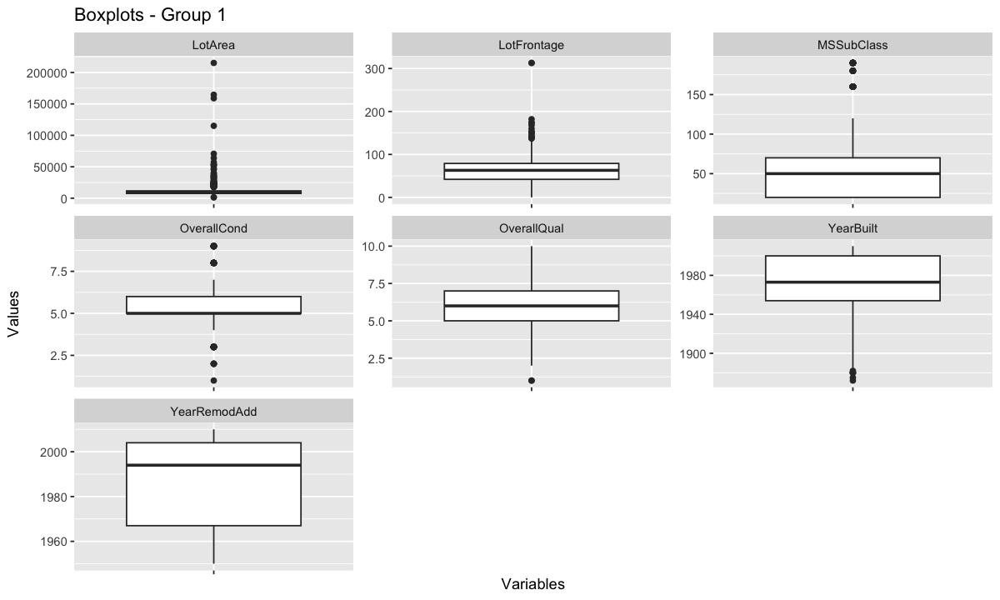

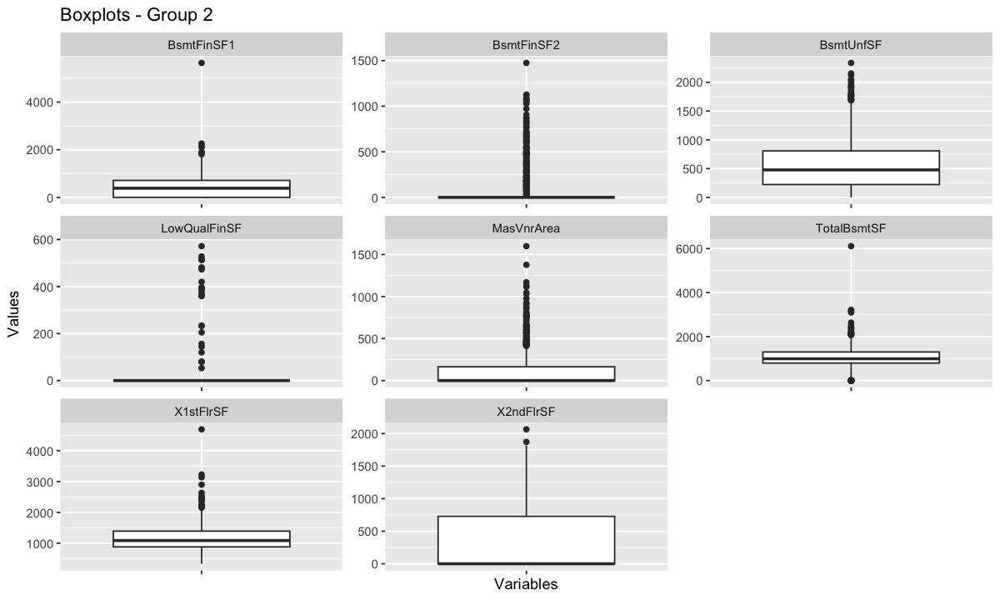

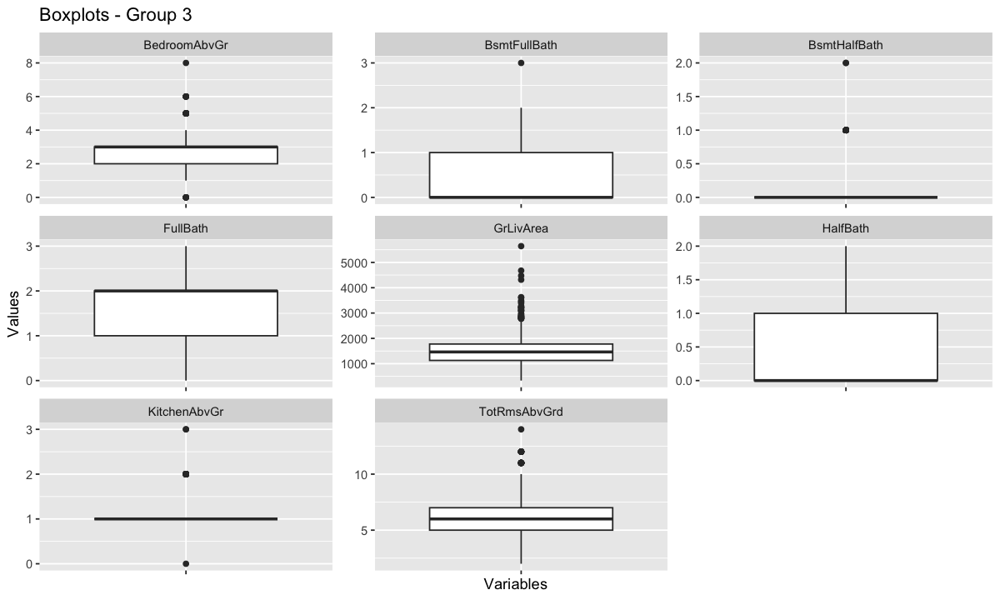

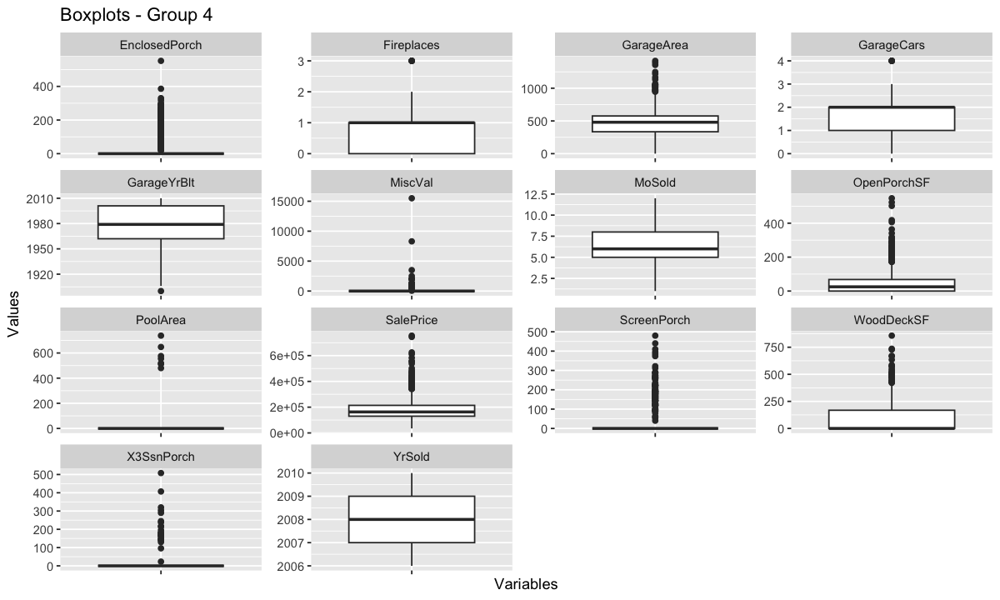

In [38]:
#ameseda_n is used for eda analysis on all numeric variables

ameseda_n <- ameseda %>%
  select_if(function(x) is.numeric(x) || is.integer(x))

#library(gridExtra)

# Preperation values for ggplot 
ames_long <- ameseda_n %>%
 pivot_longer(everything(), names_to = "variable", values_to = "value")

# Set the plot size and aspect ratio
options(repr.plot.width = 10, repr.plot.height = 6)

# Divide the variables into 4 groups

# Group 1
group1 <- c( "MSSubClass", "LotFrontage", "LotArea", "OverallQual", "OverallCond", "YearBuilt", "YearRemodAdd")

# Group 2
group2 <- c("MasVnrArea", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "X1stFlrSF", "X2ndFlrSF", "LowQualFinSF")

# Group 3
group3 <- c("GrLivArea", "BsmtFullBath", "BsmtHalfBath", "FullBath", "HalfBath", "BedroomAbvGr", "KitchenAbvGr", "TotRmsAbvGrd")

# Group 4
group4 <- c("Fireplaces", "GarageYrBlt", "GarageCars", "GarageArea", "WoodDeckSF", "OpenPorchSF", "EnclosedPorch",
            "X3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal", "MoSold", "YrSold", "SalePrice")



# Create plots for each group of variables
plot1 <- ames_long %>% 
  filter(variable %in% group1) %>% 
  ggplot(aes(x = variable, y = value)) +
  geom_boxplot() +
  facet_wrap(~variable, scales = "free") +
  theme(axis.text.x = element_blank()) +
  labs(title = "Boxplots - Group 1", x = "Variables", y = "Values")

plot2 <- ames_long %>% 
  filter(variable %in% group2) %>% 
  ggplot(aes(x = variable, y = value)) +
  geom_boxplot() +
  facet_wrap(~variable, scales = "free") +
  theme(axis.text.x = element_blank()) +
  labs(title = "Boxplots - Group 2", x = "Variables", y = "Values")

plot3 <- ames_long %>% 
  filter(variable %in% group3) %>% 
  ggplot(aes(x = variable, y = value)) +
  geom_boxplot() +
  facet_wrap(~variable, scales = "free") +
  theme(axis.text.x = element_blank()) +
  labs(title = "Boxplots - Group 3", x = "Variables", y = "Values")

plot4 <- ames_long %>% 
  filter(variable %in% group4) %>% 
  ggplot(aes(x = variable, y = value)) +
  geom_boxplot() +
  facet_wrap(~variable, scales = "free") +
  theme(axis.text.x = element_blank()) +
  labs(title = "Boxplots - Group 4", x = "Variables", y = "Values")

# Summary table on all numeric variables from dataset 
library(psych)
describe(ameseda_n)

# Display plots
plot1
plot2
plot3
plot4


Upon analyzing the boxplots and summary table, we observe that the majority of the numerical variables exhibit a right-skewed distribution. However, a few variables, namely YearBuilt, YearRemodAdd, GarageYrBlt, and GarageCars, display a left-skewed distribution. Our response variable, SalePrice, also demonstrates a right-skewed distribution and reveals the presence of outliers.

### Categorical Data Anaylsis I

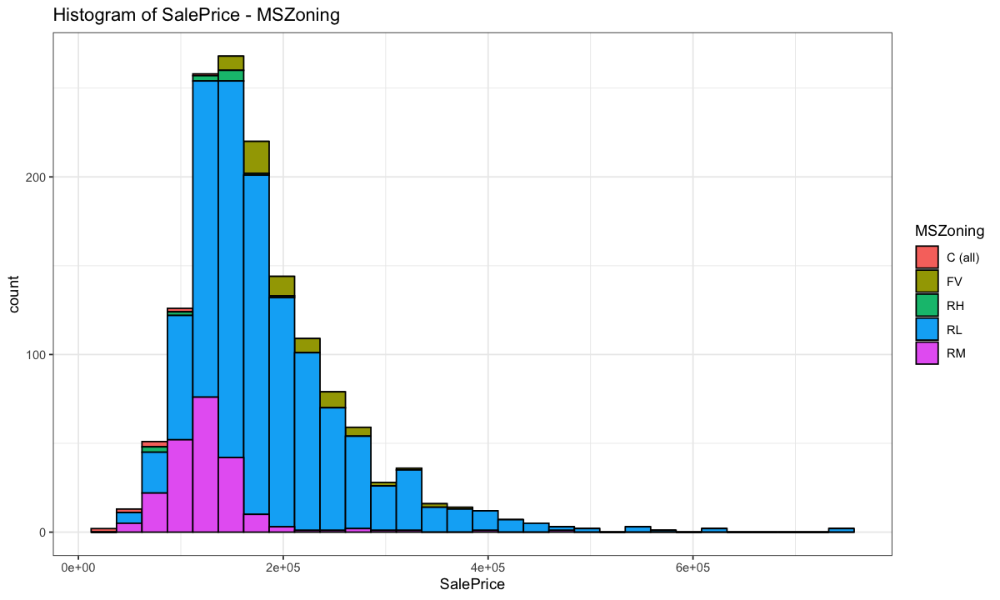

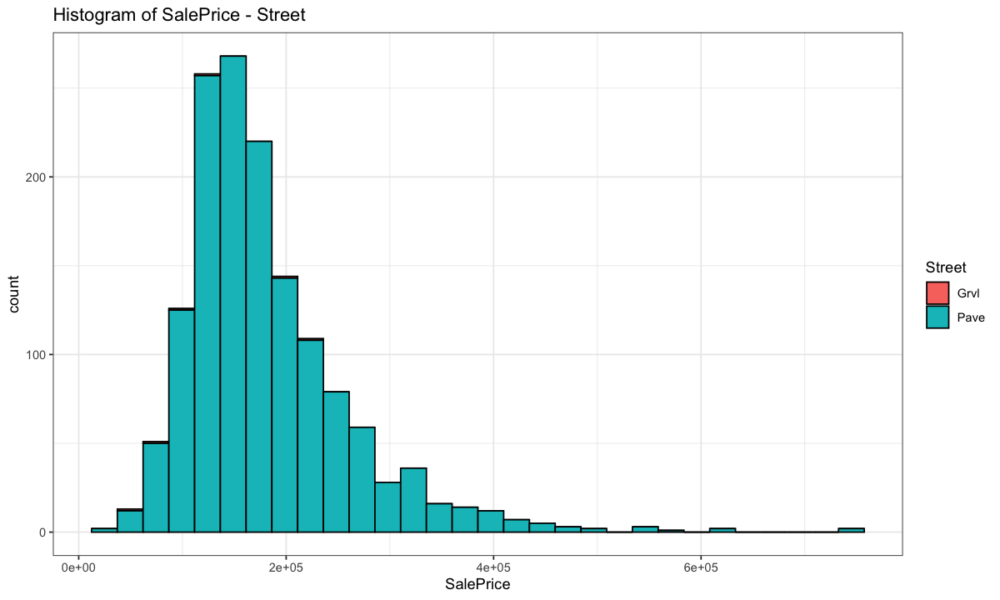

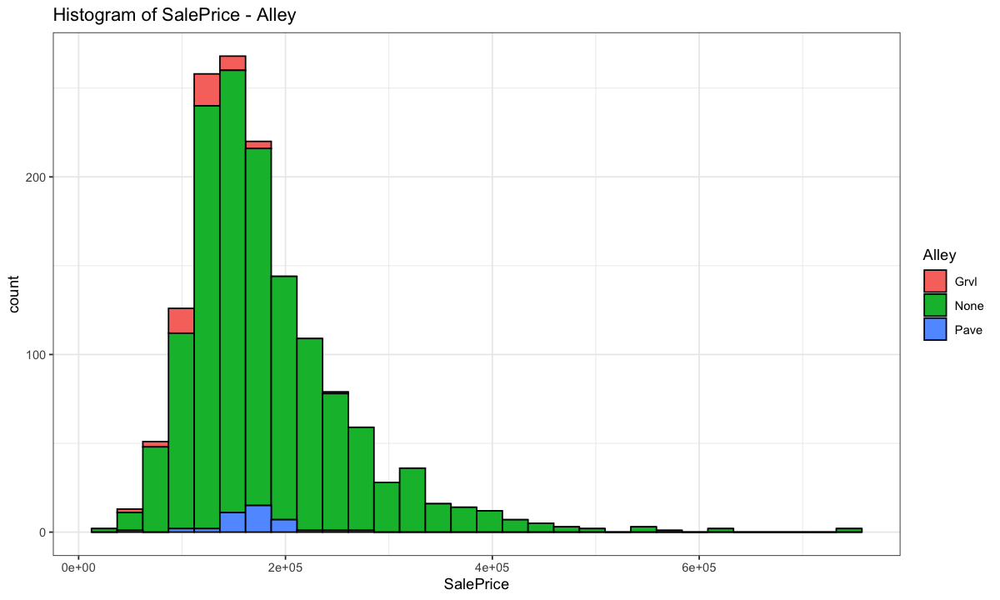

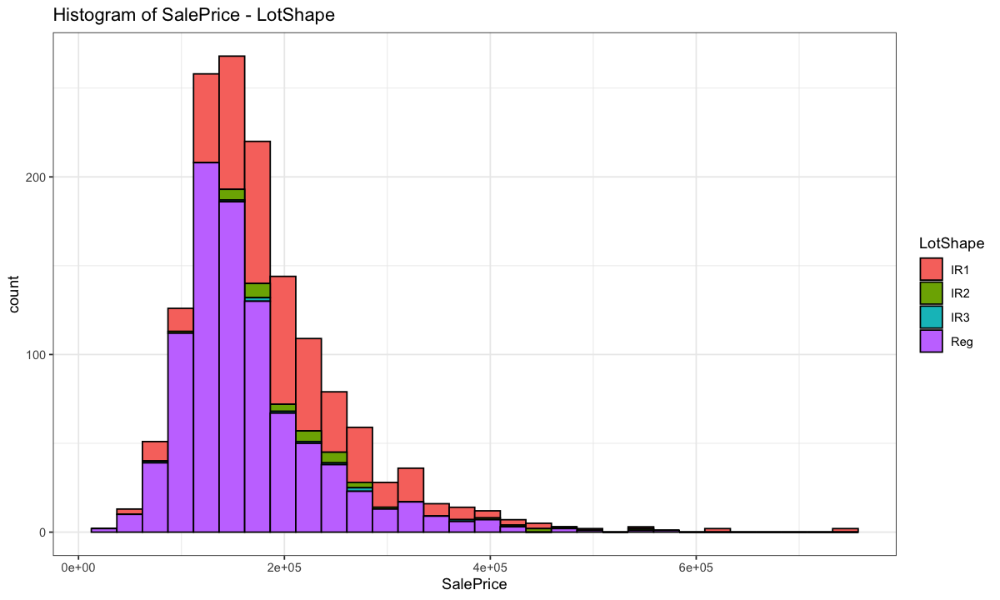

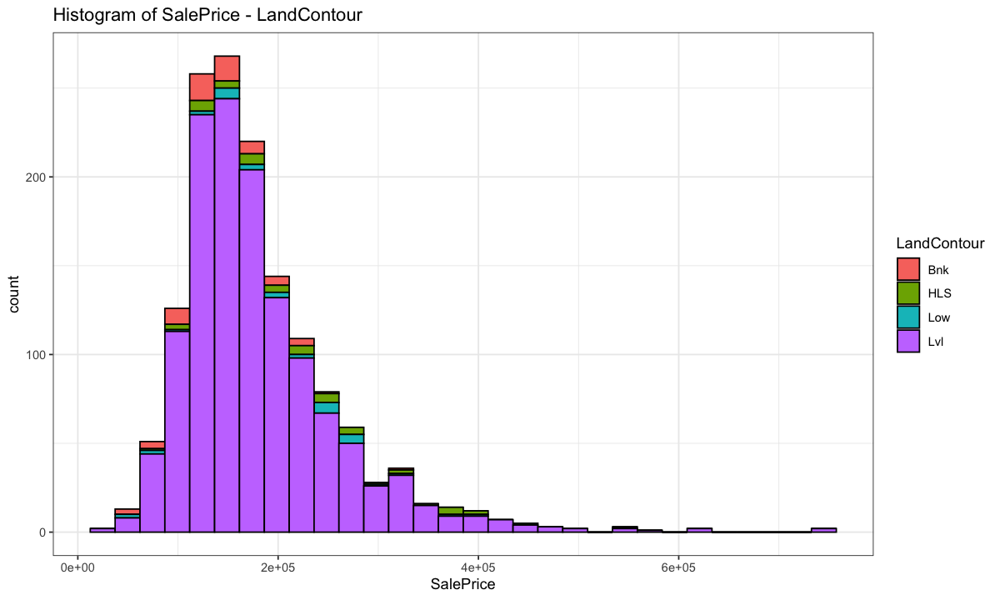

...

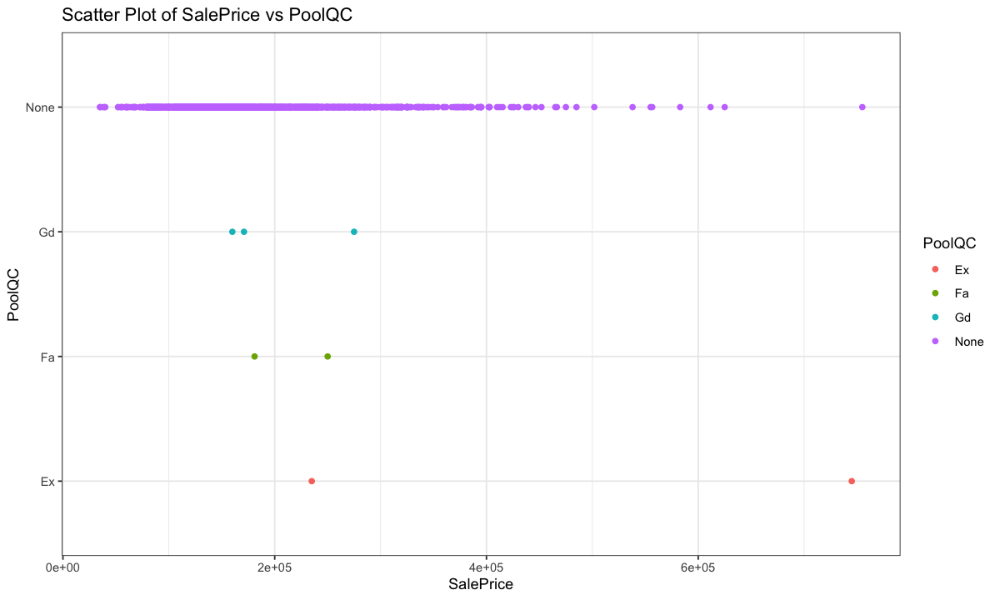

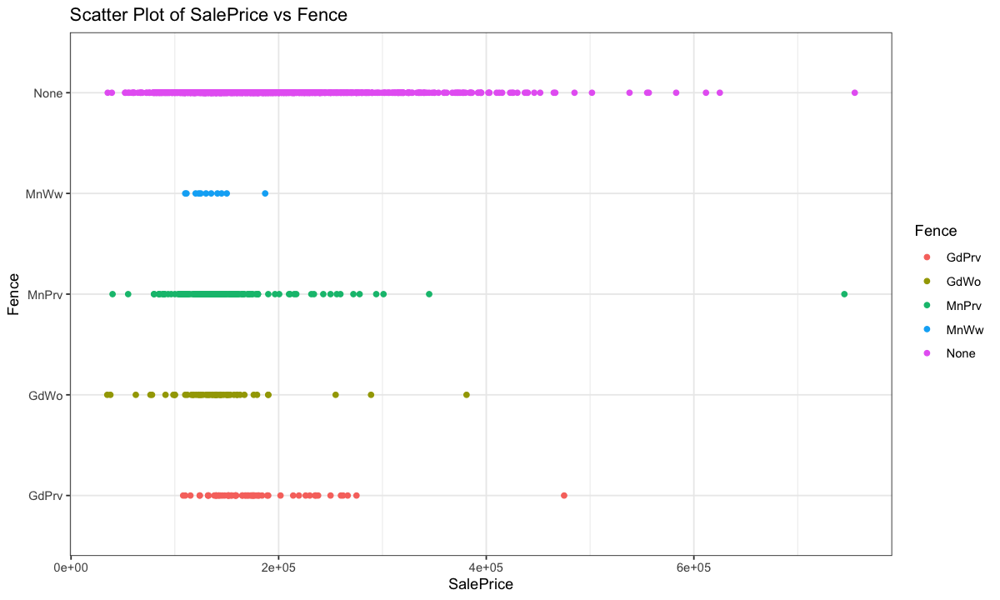

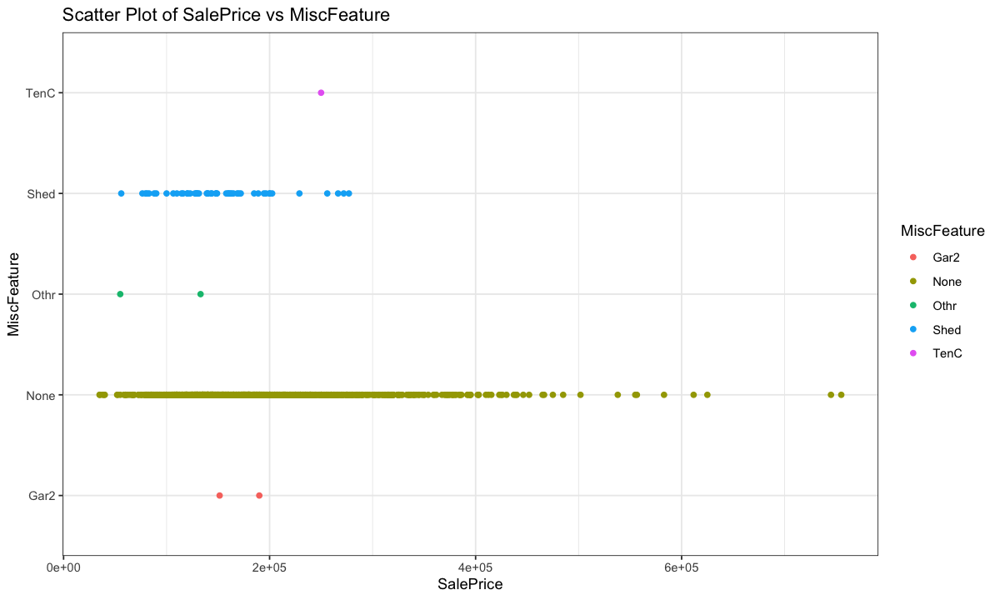

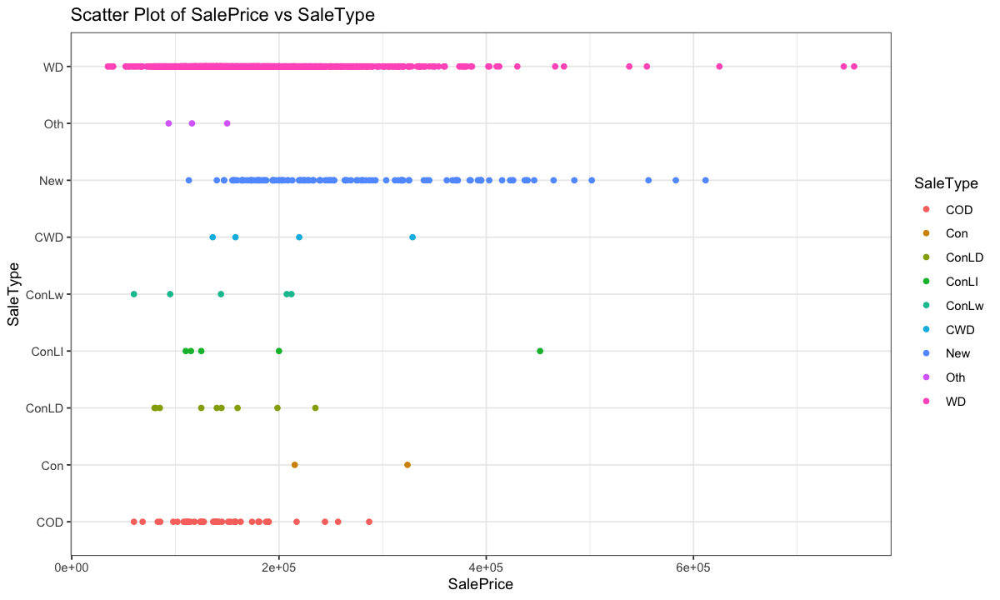

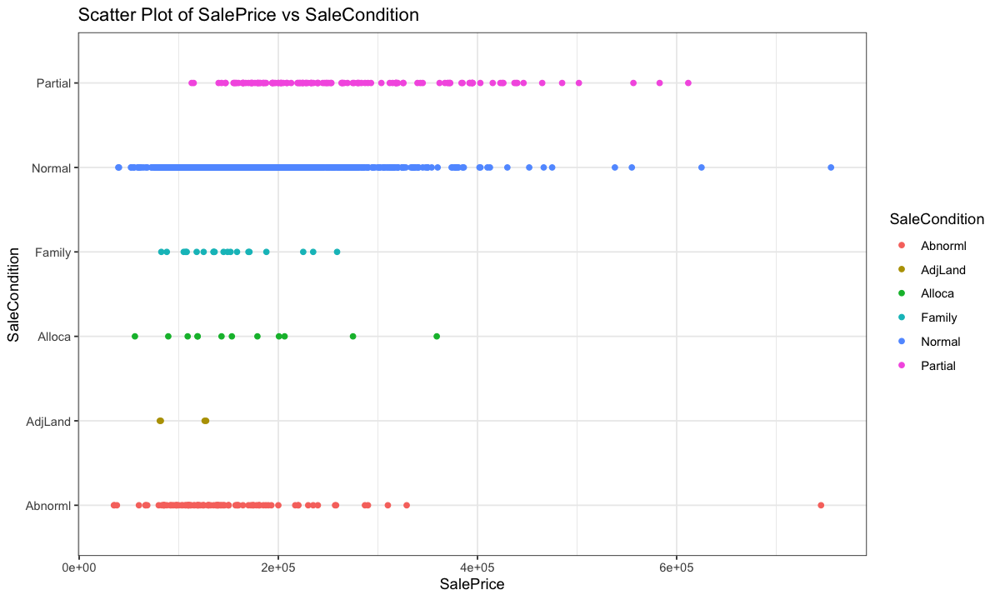

In [39]:
#creating a dataset for all categorical variables
ameseda_c <- ameseda %>%
  select_if(function(x) is.character(x))


# converting all variables into factor
ameseda_c <- ameseda_c %>% mutate_all(as.factor)

ameseda_c <- ameseda_c %>%
  mutate(SalePrice = ameseda_n$SalePrice)




# Assuming your dataset is stored in the variable 'dataset'
dataset <- ameseda_c
response_variable <- ameseda_c$SalePrice


# Assuming your dataset is stored in the variable 'dataset'
response_variable <- "SalePrice"

# Define the categorical variables (replace with the provided variable names)
categorical_variables <- c("MSZoning", "Street", "Alley", "LotShape", "LandContour", "Utilities", "LotConfig", "LandSlope",
                           "Neighborhood", "Condition1", "Condition2", "BldgType", "HouseStyle", "RoofStyle", "RoofMatl",
                           "Exterior1st", "Exterior2nd", "MasVnrType", "ExterQual", "ExterCond", "Foundation", "BsmtQual",
                           "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "Heating", "HeatingQC", "CentralAir",
                           "Electrical", "KitchenQual", "Functional", "FireplaceQu", "GarageType", "GarageFinish",
                           "GarageQual", "GarageCond", "PavedDrive", "PoolQC", "Fence", "MiscFeature", "SaleType",
                           "SaleCondition")

# Create a list to store the plots
plots <- list()

# Loop through the categorical variables and create a histogram for each
for (variable in categorical_variables) {
  plot <- ggplot(dataset, aes_string(x = response_variable, fill = variable)) +
    geom_histogram(color = "black", bins = 30) +
    labs(title = paste("Histogram of", response_variable, "-", variable),
         x = response_variable, fill = variable) +
    theme_bw()
  
  plots[[variable]] <- plot
}

# Display the plots
for (variable in categorical_variables) {
  print(plots[[variable]])
}


# Loop through the categorical variables and create a scatter plot for each
for (variable in categorical_variables) {
  plot <- ggplot(dataset, aes_string(x = response_variable, y = variable, color = variable)) +
    geom_point() +
    labs(title = paste("Scatter Plot of", response_variable, "vs", variable),
         x = response_variable, y = variable, color = variable) +
    theme_bw()
  
  print(plot)
}





# added this to summarize
#library(psych)
#describe(ameseda_n)


Based on the histograms and scatter plots of the Sales Price when separated by categorical variables, we can identify the following variables that potentially have a good distribution and may be favorable for modeling the Sales Price: MSZoning, RoofStyle, Exterior1st, Exterior2nd, LotShape, LandContour, LotConfig, Neighborhood, BldgType, HouseStyle, HeatingQC, CentralAir, KitchenQual, FireplaceQu, GarageType, GarageFinish, PavedDrive, SaleType, SaleCondition, Condition1, MasVnrType, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond, BsmtFinType1, Electrical, Functional, GarageQual, GarageCond.

Conversely, the following variables are less likely to be useful in modeling the Sales Price: Street, Alley, Utilities, LandSlope, Condition2, RoofMatl, PoolQC, Fence, MiscFeature, BsmtExposure, BsmtFinType2.These variables may not provide significant insights or exhibit a clear relationship with the Sales Price.

### Numerical Data Analysis II

Warning message in cor(ameseda_n):
“the standard deviation is zero”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


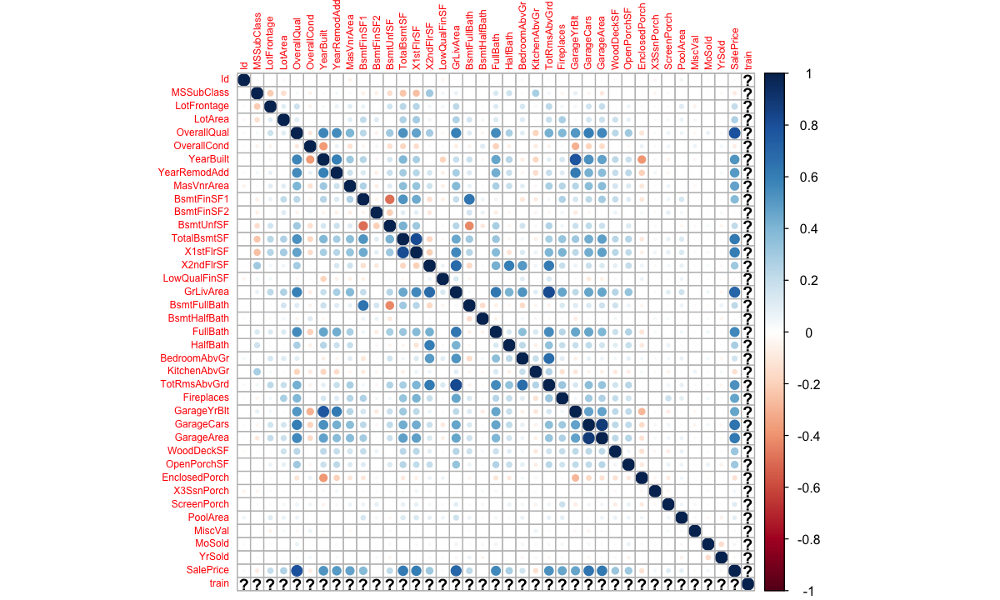

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


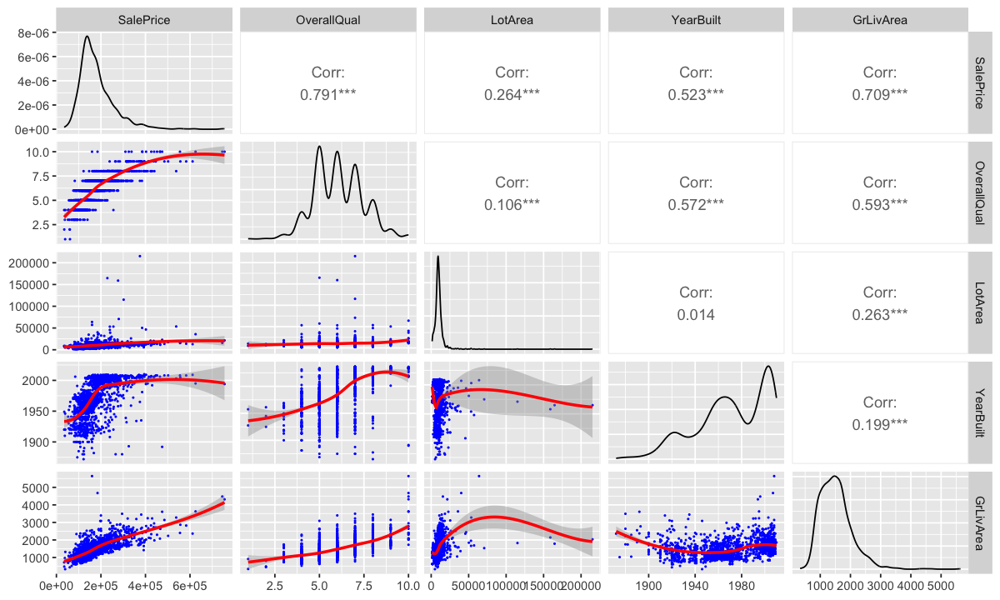

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  1.9766e-15”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.0602”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“pseudoinverse used at -0.015”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(t

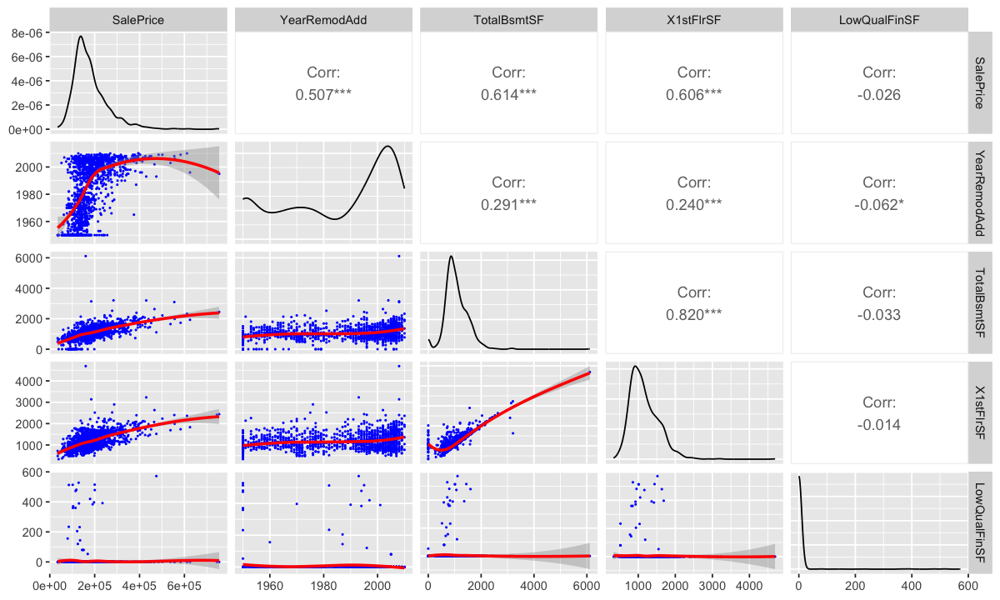

OverallQual    YearBuilt    GrLivArea YearRemodAdd    X1stFlrSF  TotalBsmtSF 
    2.866606     3.395819     5.308108     1.899803     3.782720     3.630264 
    FullBath TotRmsAbvGrd   GarageCars   Fireplaces  GarageYrBlt   GarageArea 
    2.273189     3.378850     5.383643     1.474427     3.081322     5.187775 
     LotArea 
    1.174412

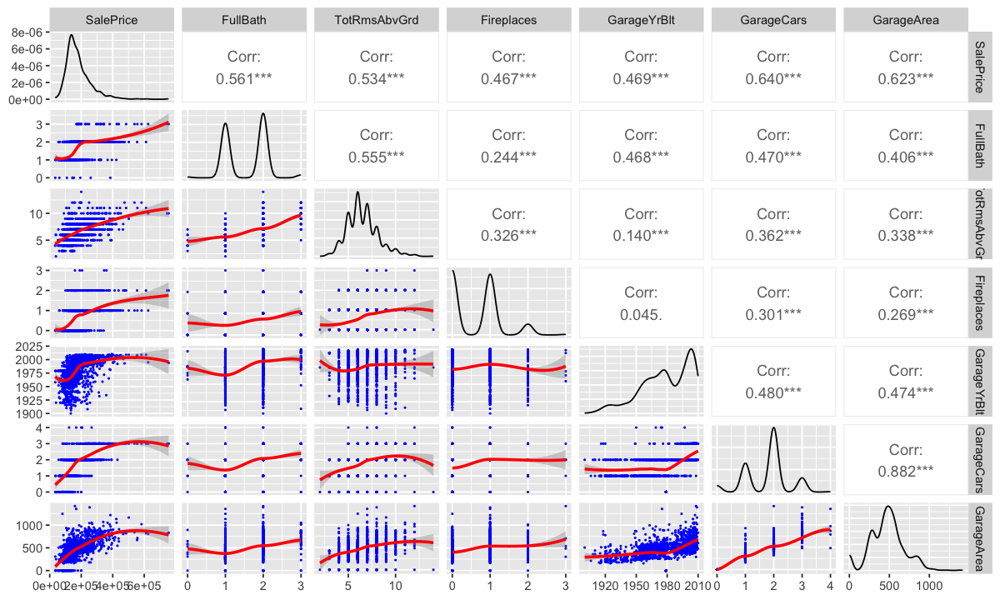

In [40]:
# create correlation plot for the numerical variables
library(corrplot)
corrplot(cor(ameseda_n),tl.cex = 0.6)


# ggpairs based on the corelation plot. We didn't plot every single numerical variable. We chose the ones that had high corelation with SalePrice from the correlation plot
library(GGally)
library(dplyr)



lowerFn <- function(data, mapping, method = "lm", ...) {
  p <- ggplot(data = data, mapping = mapping) +
    geom_point(colour = "blue", size = .2) +
    geom_smooth(method = loess, color = "red", ...)
  p
}

# First plot with selected variables
ameseda_n %>%
  select(SalePrice, OverallQual, LotArea, YearBuilt, GrLivArea) %>%
  ggpairs(lower = list(continuous = lowerFn))

# Second plot with selected variables
ameseda_n %>%
  select(SalePrice, YearRemodAdd, TotalBsmtSF, X1stFlrSF, LowQualFinSF) %>%
  ggpairs(lower = list(continuous = lowerFn))

# Third plot with selected variables
ameseda_n %>%
  select(SalePrice, FullBath, TotRmsAbvGrd, Fireplaces, GarageYrBlt, GarageCars, GarageArea) %>%
  ggpairs(lower = list(continuous = lowerFn))

library(car)
vif(lm(SalePrice ~ OverallQual + YearBuilt + GrLivArea+YearRemodAdd+ X1stFlrSF+TotalBsmtSF+FullBath+TotRmsAbvGrd+GarageCars+Fireplaces+GarageYrBlt + GarageArea + LotArea, data=ameseda_n))

Based on the correlation plot, we observed a relationship between the response variable SalePrice and several predictor variables. It is noteworthy that the relationship appears to be quadratic in most cases, which could be influenced by the presence of high SalePrice values. Among the variables, SalePrice exhibits strong correlations with the following variables: OverallQual (0.791), GrLivArea (0.709),GarageArea(0.623) GarageCars (0.640), X1stFlrSF (0.606), TotalBsmtSF (0.614), FullBath (0.561), TotalRmsAbvGrd (0.534), YearBuilt (0.523), YearRemodAdd (0.507), and GarageYrBlt (mild correlation).

The variable "LotArea" shows a correlation coefficient of 0.264 with the response variable. However, it is important to note that this correlation may be influenced by the presence of outliers with unusually high lot area values. These outliers can have a significant impact on the correlation coefficient, potentially inflating or deflating its magnitude.

Therefore, it is necessary to exercise caution when interpreting the correlation between "LotArea" and the response variable. Further analysis and consideration of the data, including the examination of outliers and their potential influence, would provide a more accurate understanding of the relationship between lot area and the response variable.

To assess multicollinearity among these correlated variables, we performed a multicollinearity analysis. Among them, GrLivArea, GarageCars, and GarageArea exhibited a borderline level of collinearity with a VIF of around 5.

It is important to consider these correlations and collinearity issues when modeling the SalePrice variable. Further analysis and modeling techniques may be necessary to address the quadratic relationships and potential collinearity effects in order to build an accurate predictive model.

### Categorical Data Analysis II

In [41]:
# Fit a linear model with categorical variables to validate our visual findings

# Use the dummyVars() function to convert categorical variables into dummy variables
# Then use janitor::clean_names() to clean up the column names
dummy_model <- dummyVars(~ ., data = ameseda_c)
ames_dummy <- as.data.frame(predict(dummy_model, newdata = ameseda_c))
ames_dummy <- clean_names(ames_dummy)


options(max.print = 2000)


cbind(ameseda_n$SalePrice, ames_dummy) %>% #str()
  lm(ameseda_n$SalePrice ~ ., data = .) %>%
  summary()


Call:
lm(formula = ameseda_n$SalePrice ~ ., data = .)

Residuals:
       Min         1Q     Median         3Q        Max 
-1.725e-09 -5.060e-11  4.900e-12  5.470e-11  1.198e-08 

Coefficients: (50 not defined because of singularities)
                          Estimate Std. Error    t value Pr(>|t|)    
(Intercept)              1.850e-09  1.088e-09  1.700e+00 0.089365 .  
`ameseda_n$SalePrice`    1.000e+00  3.283e-16  3.046e+15  < 2e-16 ***
ms_zoning_c_all         -4.339e-11  1.543e-10 -2.810e-01 0.778670    
ms_zoning_fv             2.621e-11  1.223e-10  2.140e-01 0.830385    
ms_zoning_rh            -1.298e-11  1.226e-10 -1.060e-01 0.915720    
ms_zoning_rl            -9.447e-12  6.043e-11 -1.560e-01 0.875789    
ms_zoning_rm                    NA         NA         NA       NA    
street_grvl             -3.317e-12  1.906e-10 -1.700e-02 0.986118    
street_pave                     NA         NA         NA       NA    
alley_grvl              -2.372e-11  9.685e-11 -2.450e-01 0.80655

After converting our categorical variables into dummy variables and running a model to assess their significance, we found that the variable "Neighborhood" emerged as the most significant predictor. This suggests that the neighborhood of a property plays a crucial role in determining the response variable. However, it's important to note that in a more complex model, the significance of "Neighborhood" may be influenced by its interaction with other variables.

Considering the complexity of the model, it is possible that interactions between "Neighborhood" and other variables could yield significant effects on the response variable. Therefore, it would be beneficial to explore these potential interactions and evaluate their significance in order to obtain a more comprehensive understanding of the predictors' impact on the outcome.

Here we can see that all of the neighborhood variables are significant, suggesting that neighborhood is an important factor in determining sale price. Several other categorical values look important including: lot_config_fr2, house_style1story, exter_qual_gd, fireplace_qu_none, and sale_type_con.

### Transformations

In the following chunk of code, we are generating new columns to capture transformed versions of different attributes. These transformations will be further analyzed in the subsequent sections.

In [42]:
# Create columns for log(SalePrice) and log(GrLivArea)
ames$log_sale_price <- log(ames$sale_price)
ames$log_gr_liv_area <- log(ames$gr_liv_area)

ames$overall_qual_2 = ames$overall_qual^2
ames$lot_area_2 = ames$lot_area^2
ames$log_lot_area = ames$lot_area %>% log()
# ames$year_built_t = plogis(ames_non_dummy$year_built-1940)
ames$log_total_bsmt_sf = ames$total_bsmt_sf %>% log()
ames$log_garage_area = ames$garage_area %>% log()
ames$log_x1st_flr_sf = ames$x1st_flr_sf %>% log()

### Sale Price Vs Gross Living Area by Neighborhood

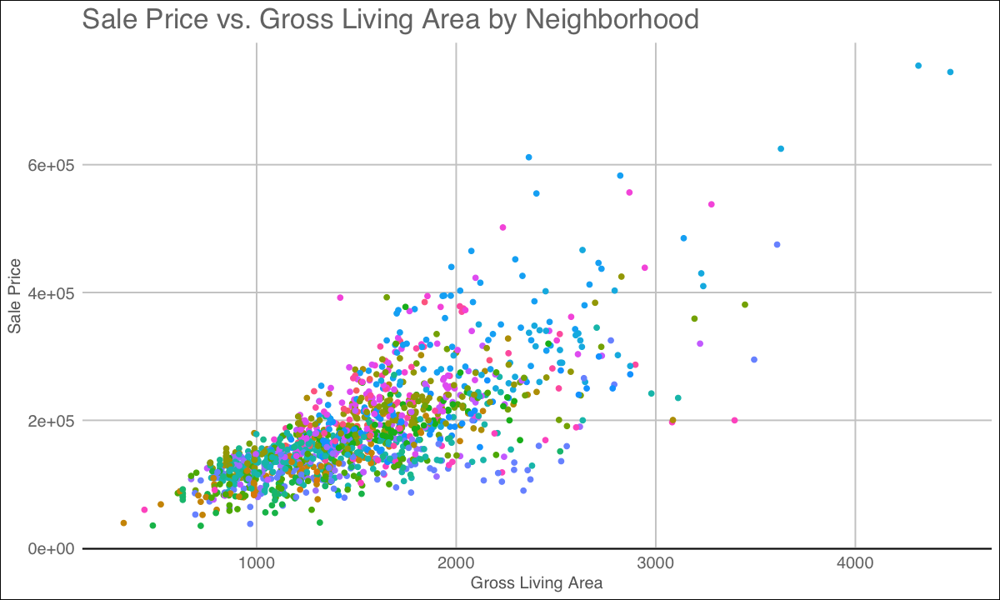

In [43]:
# Plot Sale Price vs. Gross Living Area colored by neighborhood, omitting rows where SalePrice is NA
# Convert the dataframe from wide format to long format
ames_long <- ames %>% 
  pivot_longer(
    cols = starts_with("neighborhood_"),
    names_to = "Neighborhood",
    values_to = "value"
  ) %>%
  filter(value == 1) %>%  # Keep only rows where the neighborhood dummy variable is 1
  select(-value)  # Remove the 'value' column as it's no longer needed

ames_long %>%
  filter(!is.na(sale_price)) %>%
  ggplot(aes(x = gr_liv_area, y = sale_price, color = Neighborhood)) +
  geom_point(show.legend = FALSE) +
  theme_gdocs() +
  labs(title = "Sale Price vs. Gross Living Area by Neighborhood", x = "Gross Living Area", y = "Sale Price")

The relationship between Sale Price and Gross Living Area is evident, and we can observe that neighborhoods also exhibit distinct relationships with Sale Price. This reaffirms the significance of the Neighborhood variable as observed in the previous linear model.

### Sale Price Vs Gross Living Area by Neighborhood (UnTransformed Vs Transformed)

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
Warning message:
“Removed 1459 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 1459 rows containing missing values (`geom_point()`).”
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
Warning message:
“Removed 1459 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 1459 rows containing missing values (`geom_point()`).”


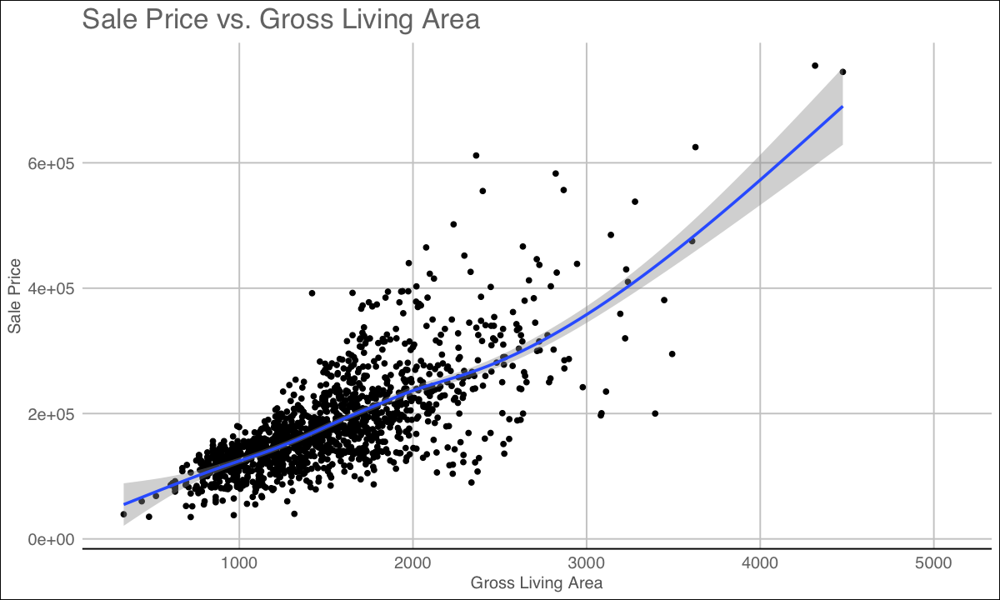

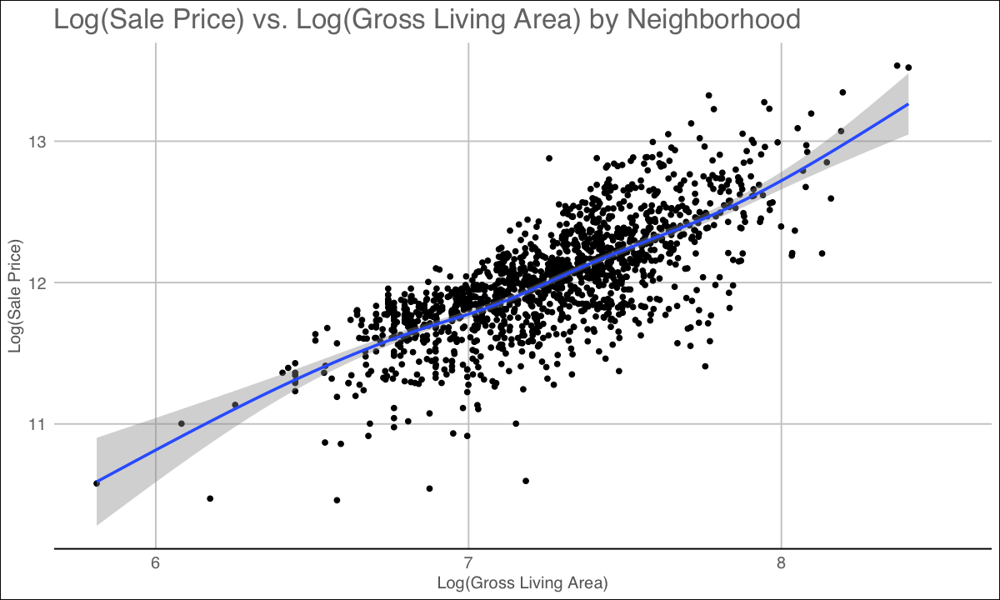

In [44]:
# Untransformed variables
par(mfrow = c(1, 2))
ames %>%
  ggplot(aes(x = gr_liv_area, y = sale_price)) +
  geom_point() +
  geom_smooth() +
  theme_gdocs() +
  labs(
    title = "Sale Price vs. Gross Living Area",
    x = "Gross Living Area",
    y = "Sale Price"
  )

# Log Transformed
ames %>%
  ggplot(aes(x = log_gr_liv_area, y = log_sale_price)) +
  geom_point() +
  geom_smooth() +
  theme_gdocs() +
  labs(
    title = "Log(Sale Price) vs. Log(Gross Living Area) by Neighborhood",
    x = "Log(Gross Living Area)",
    y = "Log(Sale Price)"
  )
par(mfrow = c(1, 1))

The log-transformed Sale Price and square footage exhibit a more linear relationship, indicating that utilizing these transformed variables will likely result in a more precise regression model. However, it is important to note that this enhanced accuracy comes at the cost of interpretability, as the transformed variables may be less intuitive to interpret directly.

### EDA Conclusion

During our exploratory data analysis (EDA), we undertook several important steps. Firstly, we cleaned the data by addressing any inconsistencies or missing values. Next, we examined both numerical and categorical variables, exploring their distributions and identifying potential patterns or trends.

We also assessed the relationships between the explanatory variables and the response variable using visual and mathematical techniques. These analyses provided valuable insights into the dependencies and correlations within the dataset.

By conducting this comprehensive EDA, we have equipped ourselves with the necessary foundation for achieving our two primary objectives: developing an interpretable regression model and constructing a more complex predictive model. The insights gained from our EDA will guide us in selecting meaningful features and formulating effective modeling strategies.

## Objective 1: Interpretable Regression Model

For this model, we will fit a linear regression with the variables that we have identified as significant. Because the focus of this model is interpretability, we will not include any interaction terms, polynomials, or other transformations.

Based on the exploratory analysis above, we will include the following variables in the regression model: - gr_liv_area - lot_area - overall_qual - year_built - year_remod_add - total_bsmt_sf - garage_area - garage_cars-tot_rms_grd - all neighborhood dummy variables - lot_config_fr2 - house_style1story - exter_qual_gd - fireplace_qu_none - sale_type_con

+ Fold01: intercept=TRUE 
- Fold01: intercept=TRUE 
+ Fold02: intercept=TRUE 
- Fold02: intercept=TRUE 
+ Fold03: intercept=TRUE 
- Fold03: intercept=TRUE 
+ Fold04: intercept=TRUE 
- Fold04: intercept=TRUE 
+ Fold05: intercept=TRUE 
- Fold05: intercept=TRUE 
+ Fold06: intercept=TRUE 
- Fold06: intercept=TRUE 
+ Fold07: intercept=TRUE 
- Fold07: intercept=TRUE 
+ Fold08: intercept=TRUE 
- Fold08: intercept=TRUE 
+ Fold09: intercept=TRUE 
- Fold09: intercept=TRUE 
+ Fold10: intercept=TRUE 
- Fold10: intercept=TRUE 
Aggregating results
Fitting final model on full training set



Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-133463  -14543     267   14083  229636 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)            -1.477e+06  1.462e+05 -10.098  < 2e-16 ***
gr_liv_area             6.197e+01  3.872e+00  16.006  < 2e-16 ***
lot_area                7.219e-01  9.298e-02   7.764 1.56e-14 ***
overall_qual            1.489e+04  1.074e+03  13.864  < 2e-16 ***
year_built              3.766e+02  6.327e+01   5.952 3.34e-09 ***
year_remod_add          3.633e+02  5.383e+01   6.749 2.17e-11 ***
total_bsmt_sf           2.940e+01  3.083e+00   9.537  < 2e-16 ***
garage_area             2.915e+01  8.774e+00   3.322 0.000915 ***
garage_cars             2.010e+03  2.601e+03   0.773 0.439841    
tot_rms_abv_grd        -1.963e+03  9.365e+02  -2.096 0.036268 *  
lot_config_fr2         -6.850e+03  4.603e+03  -1.488 0.136901    
house_style1story       4.185e+03  2.376e+03   1.762 

,2.5 %,97.5 %
(Intercept),-1.763431e+06,-1.189758e+06
gr_liv_area,5.437895e+01,6.956926e+01
lot_area,5.395554e-01,9.043484e-01
overall_qual,1.278191e+04,1.699522e+04
year_built,2.524593e+02,5.006983e+02
year_remod_add,2.576682e+02,4.688461e+02
total_bsmt_sf,2.335389e+01,3.544940e+01
garage_area,1.193809e+01,4.635941e+01
garage_cars,-3.092948e+03,7.113031e+03
tot_rms_abv_grd,-3.800020e+03,-1.257428e+02


gr_liv_area               lot_area           overall_qual 
              6.119696               1.330005               3.457755 
            year_built         year_remod_add          total_bsmt_sf 
              5.776320               1.953742               2.590506 
           garage_area            garage_cars        tot_rms_abv_grd 
              5.487614               5.977905               3.624424 
        lot_config_fr2      house_style1story          exter_qual_gd 
              1.046770               2.234979               2.121050 
     fireplace_qu_none          sale_type_con   neighborhood_blmngtn 
              1.561501               1.057530               2.709162 
  neighborhood_blueste   neighborhood_br_dale  neighborhood_brk_side 
              1.210918               2.701003               7.064866 
 neighborhood_clear_cr  neighborhood_collg_cr   neighborhood_crawfor 
              3.782530              14.312582               6.095947 
  neighborhood_edwards   neighborhood_gilbert    neighborhood_idotrr 
             10.480114               8.559913               5.024747 
 neighborhood_meadow_v   neighborhood_mitchel    neighborhood_n_ames 
              2.808394               5.729236              20.259443 
 neighborhood_no_ridge neighborhood_n_pk_vill  neighborhood_nridg_ht 
              5.011334               1.907839               8.390586 
  neighborhood_nw_ames  neighborhood_old_town    neighborhood_sawyer 
              7.877871              12.704237               8.151082 
 neighborhood_sawyer_w   neighborhood_somerst  neighborhood_stone_br 
              6.592783               9.026582               3.442478 
    neighborhood_swisu    neighborhood_timber 
              3.763247               4.652215

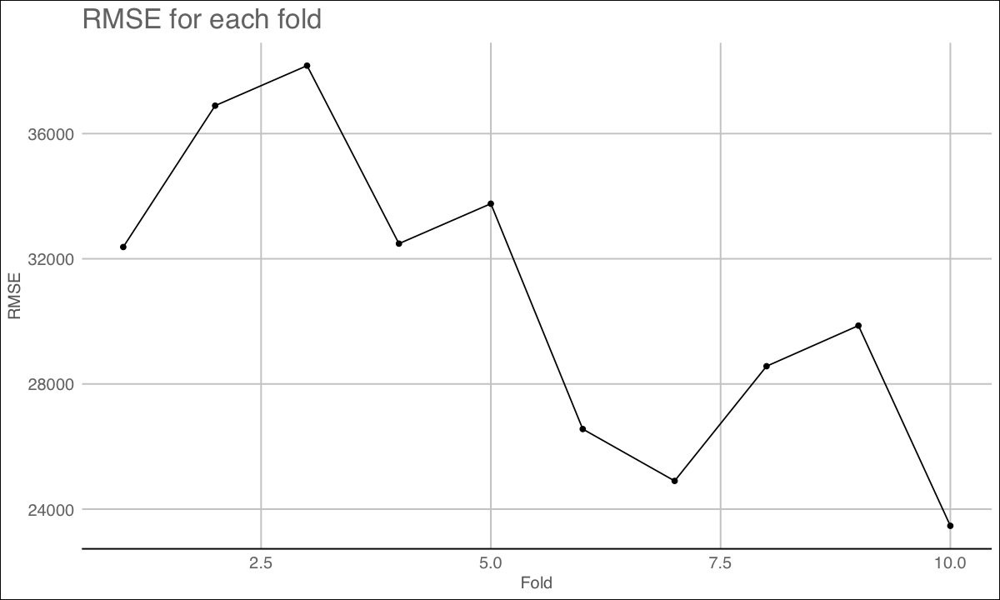

In [45]:
# Split the data into training and testing sets
train <- ames %>%
  filter(train == 1) %>%
  select(-train)
test <- ames %>%
  filter(train == 0) %>%
  select(-train)

# Train a linear regression model with caret using CV

predictor_vars <- c(
  "gr_liv_area", "lot_area", "overall_qual", "year_built", "year_remod_add",
  "total_bsmt_sf", "garage_area","garage_cars","tot_rms_abv_grd", #"x1st_flr_sf", "x2nd_flr_sf", #removed for vif
 "lot_config_fr2", "house_style1story", "exter_qual_gd", "fireplace_qu_none", "sale_type_con"
) %>% paste(collapse = " + ")
neighborhood_vars <- grep("neighborhood", colnames(train), value = TRUE) %>% paste(collapse = " + ")
terms <- (paste(predictor_vars, neighborhood_vars, sep = " + ", collapse = " + "))
formula <- as.formula(paste("sale_price ~", terms, "- neighborhood_veenker"))

set.seed(137)
ctrl <- trainControl(method = "cv", number = 10, verboseIter = TRUE)
lmFit <- train(formula, data = train, method = "lm", trControl = ctrl, metric = "RMSE")
summary(lmFit)
confint(lmFit$finalModel)

library(car)
vif(lmFit$finalModel)

# Plot the RMSE for each fold
lmFit$resample %>%
  ggplot(aes(x = (1:10), y = RMSE)) +
  geom_point() +
  geom_line() +
  theme_gdocs() +
  labs(title = "RMSE for each fold", x = "Fold", y = "RMSE")

Summary table of coefficients.

In [46]:
# Summary table of coefficients

# Create a tidy data frame from the model and round the numbers
tidy_fit <- lmFit$finalModel %>%
  broom::tidy() %>%
  mutate(across(where(is.numeric), ~round(., 4)))

# Create a table with bolded rows for p-value < 0.05
table <- tidy_fit %>%
  kable("html") %>%
  kable_styling(bootstrap_options = c("striped", "hover", "condensed", "responsive"), full_width = F) %>%
  row_spec(which(tidy_fit$p.value < 0.05), bold = T)

table

<table class="table table-striped table-hover table-condensed table-responsive" style="width: auto !important; margin-left: auto; margin-right: auto;">
 <thead>
  <tr>
   <th style="text-align:left;"> term </th>
   <th style="text-align:right;"> estimate </th>
   <th style="text-align:right;"> std.error </th>
   <th style="text-align:right;"> statistic </th>
   <th style="text-align:right;"> p.value </th>
  </tr>
 </thead>
<tbody>
  <tr>
   <td style="text-align:left;font-weight: bold;"> (Intercept) </td>
   <td style="text-align:right;font-weight: bold;"> -1476594.2891 </td>
   <td style="text-align:right;font-weight: bold;"> 146222.8999 </td>
   <td style="text-align:right;font-weight: bold;"> -10.0982 </td>
   <td style="text-align:right;font-weight: bold;"> 0.0000 </td>
  </tr>
  <tr>
   <td style="text-align:left;font-weight: bold;"> gr_liv_area </td>
   <td style="text-align:right;font-weight: bold;"> 61.9741 </td>
   <td style="text-align:right;font-weight: bold;"> 3.8718 </td>


Note that the reference Neighborhood is Veenker, so all neighborhood adjustments are relative to it.

The interpretable linear regression does moderately well. Its RMSE from 10-fold cross validation on the training data is \$30,340. This means that the model is within about \$60,000 95% of the time. Given that the mean sale price for a house in Ames during the time period covered by our dataset is \$180,000, the RMSE implies that the predicted price is within 33% of the actual price 95% of the time. This is not great, but it is a good starting point.

The benefit of this type of model is its interpretability. To demonstrate this, we will interpret one numerical coefficient and one categorical coefficient.

-   Holding all other variables constant a one hundred square foot increase in gross living area is associated with a \$4,593 increase in sale price (p \< 0.001 from linear regression). Based on our model, we can be 95% confidence that the true increase in sale price is between \$4,171 and \$5,013 for a one hundred square foot increase in gross living area.

-   Holding all other variables constant, being located in the Old Town neighborhood is associated with a \$47,703 decrease in sale price compared to a house in the Veenker neighborhood (p \< 0.001 from linear regression). Based on our model, we can be 95% confident that the true decrease in sale price is between \$35,888 and \$59,518 for a house in the Old Town neighborhood compared to a house in the Veenker neighborhood.

Because we are using a linear regression model, we must check the assumptions of the model:

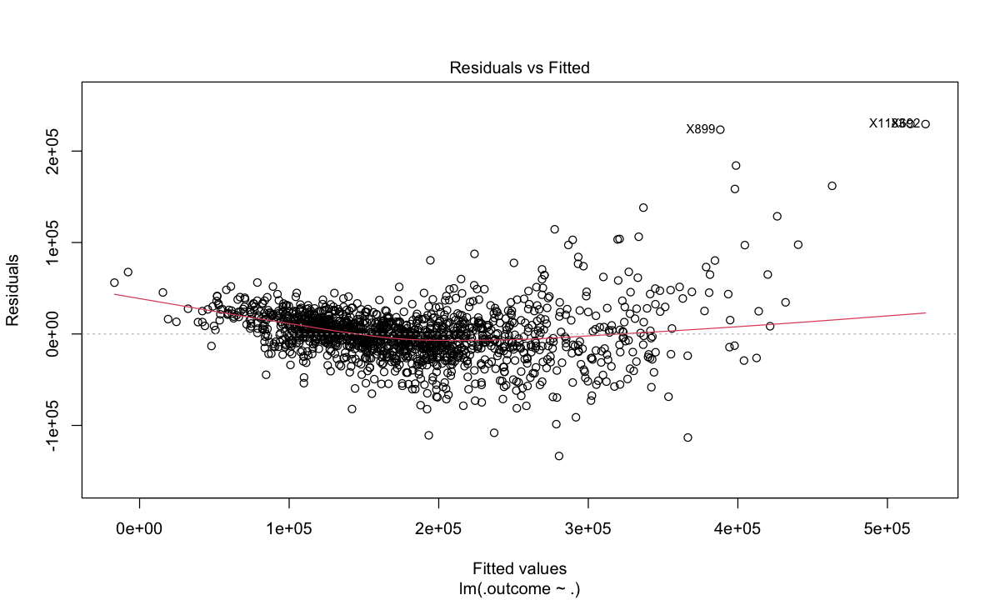

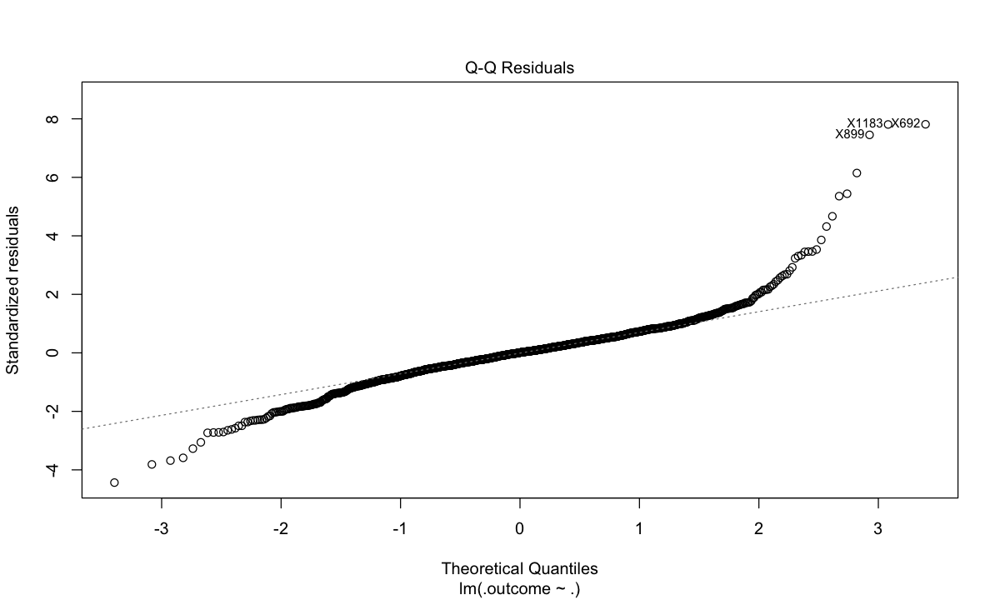

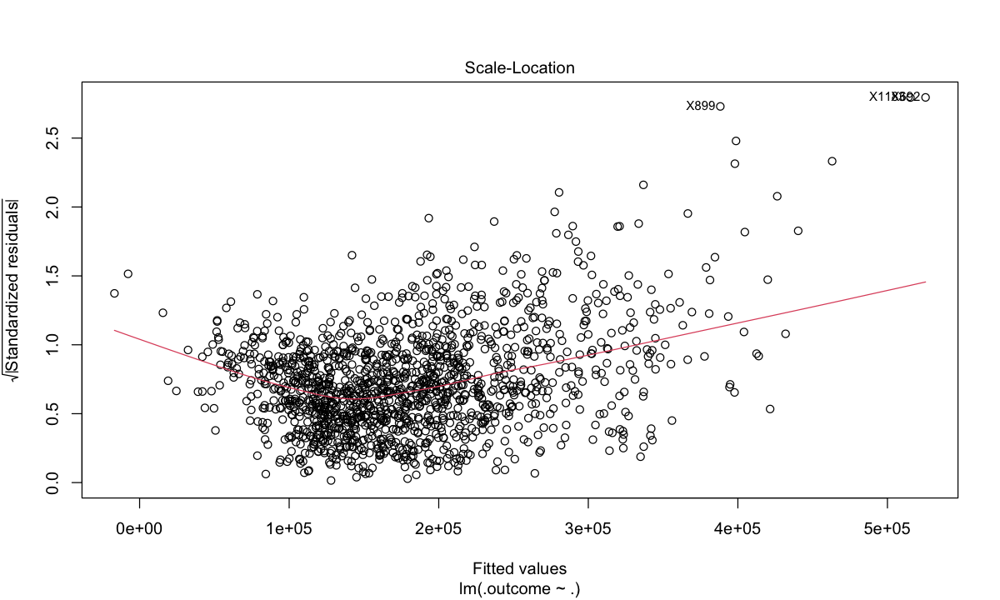

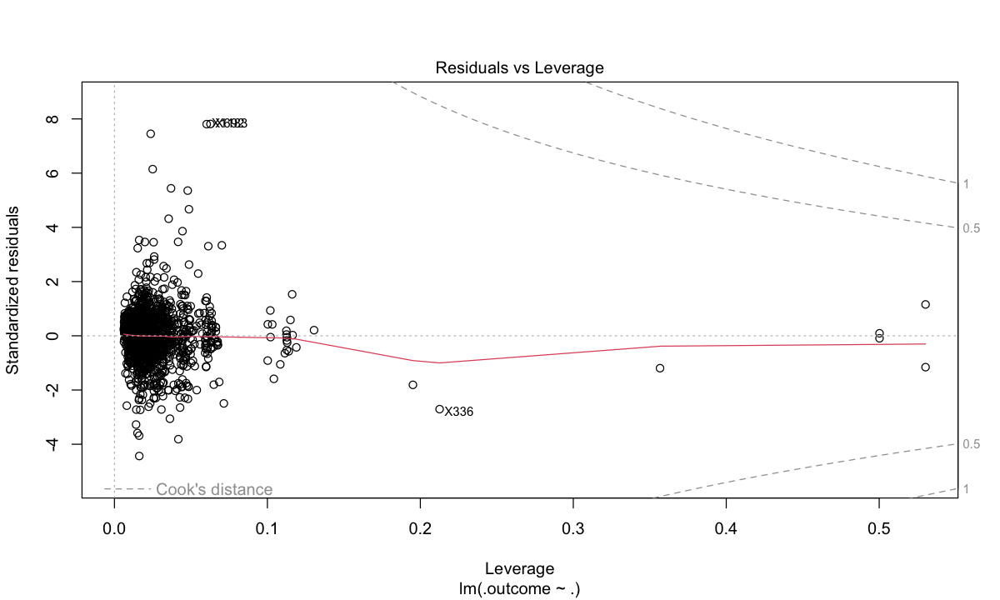

In [47]:
plot(lmFit$finalModel)

The residuals for this model show some evidence of non-linearity and non-constant variance (heteroscedasticity). There is no evidence of non-normality, and there are no influential points that need to be addressed. We will address the issues in the next section when including transformations in our model.



## Objective 2: Predictive Model

To fit a linear model with more complexity, we included the transformations dicussed in the EDA. This includes using the log of sale price, gross living area, and the other areas measured. Using log transformations will make it difficult to interpret the coefficients, but it will result in better predictions based on the realtionships shown below.

EDA for transformed continuous variables:

Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using fo

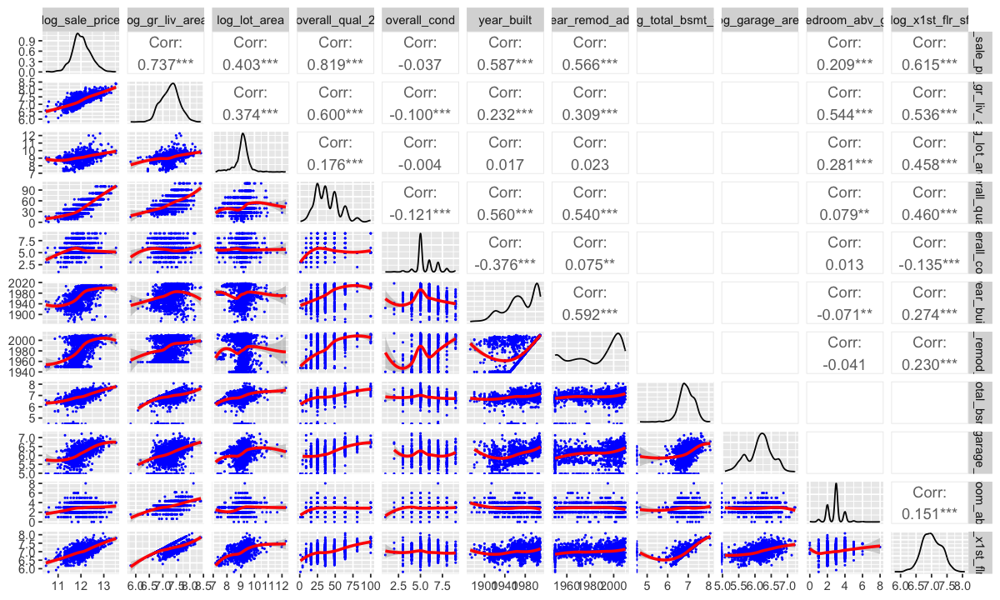

In [48]:
# ames_non_dummy <- ames[sapply(ames, calculate_range) != 1]
train %>%
  select(log_sale_price, log_gr_liv_area, log_lot_area, overall_qual_2, overall_cond,
  year_built, year_remod_add, log_total_bsmt_sf, log_garage_area, bedroom_abv_gr, log_x1st_flr_sf) %>%
  ggpairs(lower=list(continuous=lowerFn))

EDA For interactions?: Running interaction model in the background. Will include if it finishes in time.

Complex LR with feature selection:

RMSE  Rsquared       MAE 
0.1412647 0.8750146 0.1038642

,Overall
,<dbl>
log_gr_liv_area,0.404857597
neighborhood_idotrr,0.205928490
neighborhood_gilbert,0.156110544
log_lot_area,0.139474710
neighborhood_edwards,0.131285722
neighborhood_br_dale,0.110631767
neighborhood_old_town,0.105102551
neighborhood_sawyer_w,0.104842305
neighborhood_crawfor,0.096610610


glmnet 

1458 samples
  37 predictor

No pre-processing
Resampling: Cross-Validated (5 fold) 
Summary of sample sizes: 1166, 1166, 1167, 1166, 1167 
Resampling results across tuning parameters:

  alpha  lambda        RMSE       Rsquared   MAE      
  0.10   0.0006543964  0.1457942  0.8677977  0.1072713
  0.10   0.0065439640  0.1459272  0.8675386  0.1071822
  0.10   0.0654396404  0.1498018  0.8651849  0.1085737
  0.55   0.0006543964  0.1458369  0.8676922  0.1072402
  0.55   0.0065439640  0.1461345  0.8672977  0.1072563
  0.55   0.0654396404  0.1665586  0.8475884  0.1189285
  1.00   0.0006543964  0.1458812  0.8676002  0.1072906
  1.00   0.0065439640  0.1471834  0.8656324  0.1081394
  1.00   0.0654396404  0.1856431  0.8263513  0.1338341

RMSE was used to select the optimal model using the smallest value.
The final values used for the model were alpha = 0.1 and lambda = 0.0006543964.

37 x 1 sparse Matrix of class "dgCMatrix"
                                 s1
(Intercept)            -3.384558508
log_gr_liv_area         0.404857597
log_lot_area            0.139474710
overall_qual_2          0.007509962
year_built              0.002918634
year_remod_add          0.002635765
log_total_bsmt_sf       .          
log_garage_area         .          
lot_config_fr2         -0.048520536
house_style1story       0.029014767
exter_qual_gd          -0.018449066
fireplace_qu_none      -0.051729657
sale_type_con           0.095257832
neighborhood_blmngtn   -0.052052229
neighborhood_blueste   -0.011140420
neighborhood_br_dale   -0.110631767
neighborhood_brk_side  -0.022692580
neighborhood_clear_cr  -0.006013703
neighborhood_collg_cr  -0.072704174
neighborhood_crawfor    0.096610610
neighborhood_edwards   -0.131285722
neighborhood_gilbert   -0.156110544
neighborhood_idotrr    -0.205928490
neighborhood_meadow_v  -0.090050461
neighborhood_mitchel   -0.092102541
neighborhood_n_ames   

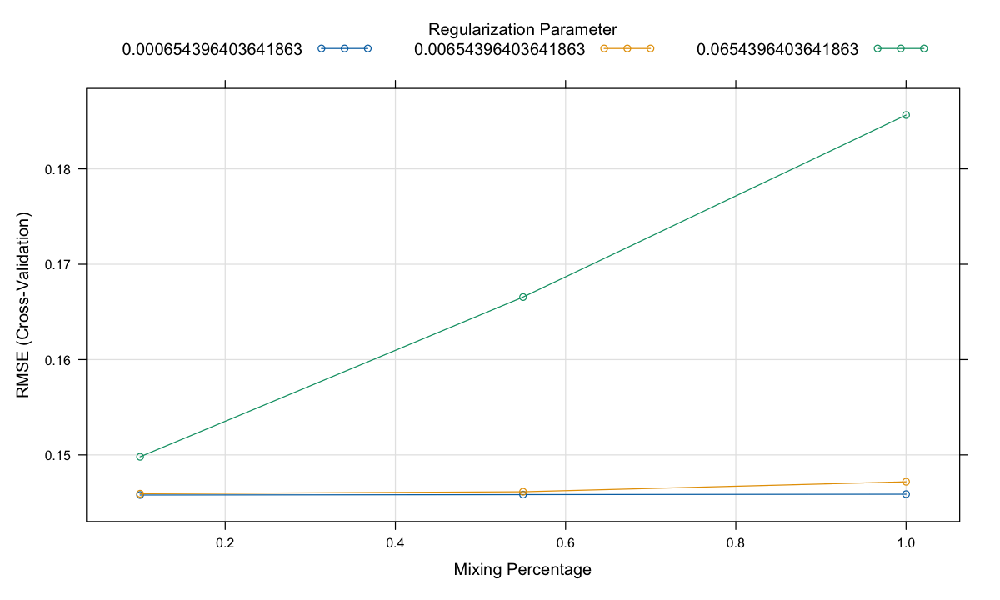

In [49]:
# Define variables to be used and create formula
predictor_vars <- c(
  "log_gr_liv_area", "log_lot_area", "overall_qual_2", "year_built", "year_remod_add",
  "log_total_bsmt_sf", "log_garage_area", "lot_config_fr2", "house_style1story", "exter_qual_gd",
  "fireplace_qu_none", "sale_type_con"#, ". -sale_price" #Can include "." to make really complex
) %>% paste(collapse = " + ")
neighborhood_vars <- grep("neighborhood", colnames(train), value = TRUE) %>% paste(collapse = " + ")
terms <- (paste(predictor_vars, neighborhood_vars, sep = " + "))
formula <- as.formula(paste("log_sale_price ~", terms, "- neighborhood_veenker"))

# Complex LR with stepwise selection

# Check if the model object exists, train if it doesn't
if (file.exists("Models/lm_complex.rds")) {
  # Load the model object from disk
  lmComp <- readRDS("Models/lm_complex.rds")
} else {
  # Set up a parallel backend with the number of cores you want to use
  cores <- 8 # Change this to the number of cores you want to use
  cl <- makePSOCKcluster(cores)
  registerDoParallel(cl)

  set.seed(137)
  lmComp <- train(formula,
    data = train,
    method = "glmnet",
    trControl = trainControl(method = "cv", number = 5, allowParallel = TRUE),
    direction = "both",
    penter = 0.05 # Not Working.
  )
  
  # Stop the parallel backend
  stopCluster(cl)
  
  # Save the model object to disk
  saveRDS(lmComp, "Models/lm_complex.rds")
}

defaultSummary(data.frame(pred = predict(lmComp), obs = train$log_sale_price))
varImp(lmComp$finalModel) %>%
  filter(Overall > 0) %>%
  arrange(desc(Overall))

# Glmnet Regression model summary
lmComp
plot(lmComp)
opt.pen<-lmComp$finalModel$lambdaOpt #penalty term
coef(lmComp$finalModel,opt.pen)

# Output the predictions for the test set to a csv file
# Select only these variables from the testing dataset
# Get the names of the variables used in the model
var_names <- lmComp$finalModel$xNames
new_test <- test[, c(var_names, "neighborhood_veenker")]
id_col <- test$id
stepwise_pred <- predict(lmComp, newdata = as.matrix(new_test))

# Save predictions
data.frame(id = id_col, SalePrice = exp(stepwise_pred)) %>%
  dplyr::select(id, SalePrice) %>%
  write_csv("Predictions/complexlm_predictions.csv")

# stepwise_pred %>%
#   data.frame() %>%
#   rownames_to_column(var = "id") %>%
#   mutate(SalePrice = exp(stepwise_pred)) %>%
#   dplyr::select(id, SalePrice) %>%
#   write_csv("Predictions/complexlm_predictions.csv")

The linear regression model with transformations does better than the interpretable model. The RMSE is 0.0152 on the log scale which translates to roughly a 16% multiplicative change on the original scale. Interpreting this is difficult due to the complexity of the model, but this approximately corresponds to a \$27,000 error in the predicted sale price. This is a significant improvement over the \$30,000 error from the interpretable model. 

From the coefficients, we can see that the penalized regression included most of the coefficients from the previous model. Total basement area and garage are ended up being excluded, as well as Neghborhoods blmngtn and blueste.

Because we are still using a linear regression model, we must check the assumptions of the model:

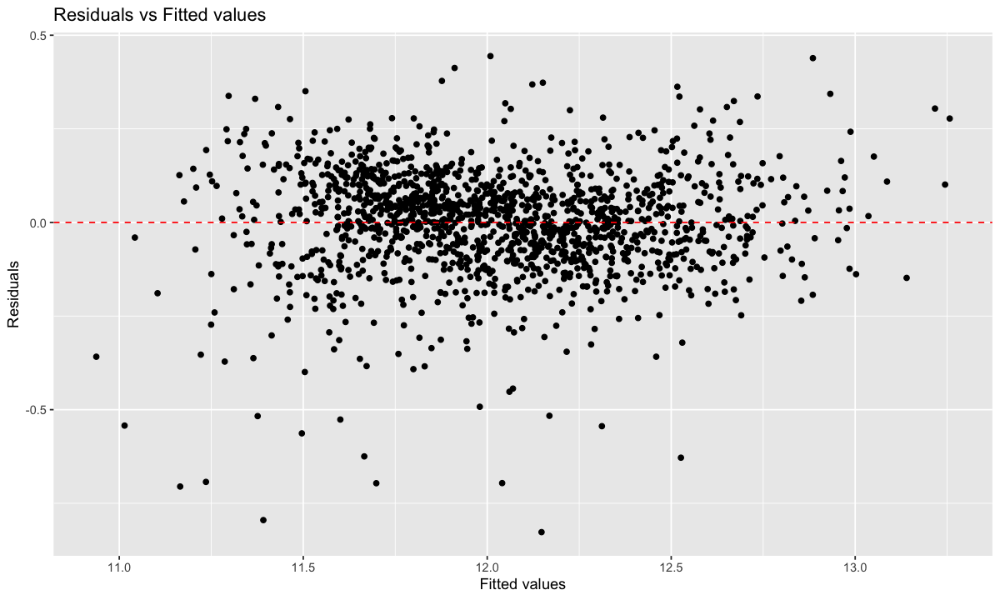

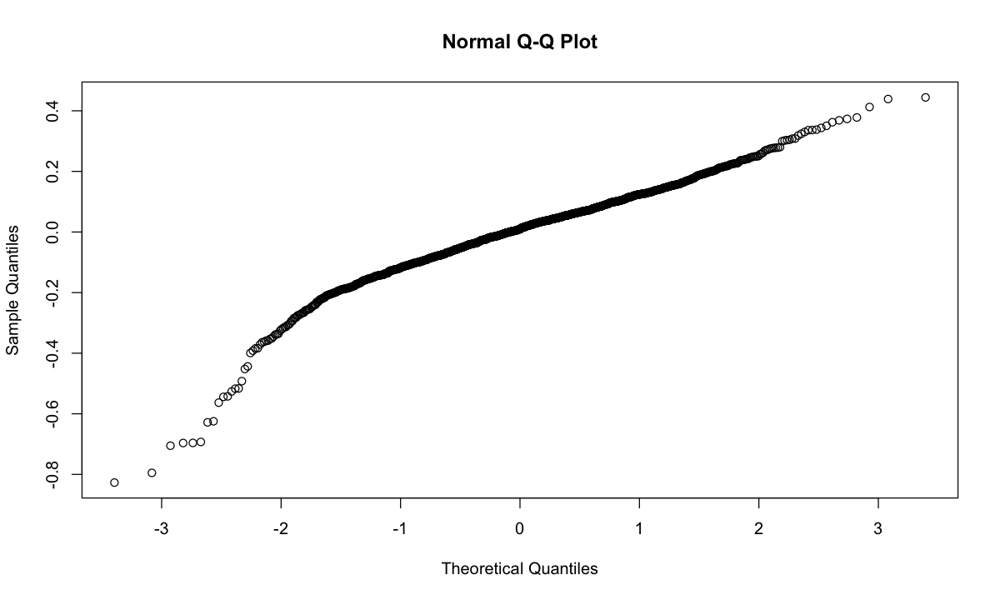

In [50]:
# Plot the residuals of lmComp

# Choose a lambda value
lambda <- lmComp$bestTune$lambda

# Get predictions for this lambda
predictions <- predict(lmComp$finalModel, newx = as.matrix(train[, c(var_names)]), s = lambda)

# Calculate residuals
residuals <- train$log_sale_price - predictions

# Plot residuals
ggplot() +
  geom_point(aes(x = predictions, y = residuals)) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(x = "Fitted values", y = "Residuals", title = "Residuals vs Fitted values")

## Q-Q plot
qqnorm(residuals)

The residuals for this model don't show any evidence of non-linearity or non-constant variance (heteroscedasticity). There is no evidence of non-normality. There are two influential points that could be addressed if there was more time. Because of the transformations, the more complex linear model better meets the assumptions of linear regression than the interpretable model.

randomForest 4.7-1.1

Type rfNews() to see new features/changes/bug fixes.


Attaching package: ‘randomForest’


The following object is masked from ‘package:psych’:

    outlier


The following object is masked from ‘package:dplyr’:

    combine


The following object is masked from ‘package:ggplot2’:

    margin





Call:
 randomForest(formula = formula, data = df, ntree = 500) 
               Type of random forest: regression
                     Number of trees: 500
No. of variables tried at each split: 12

          Mean of squared residuals: 0.01842256
                    % Var explained: 87.03


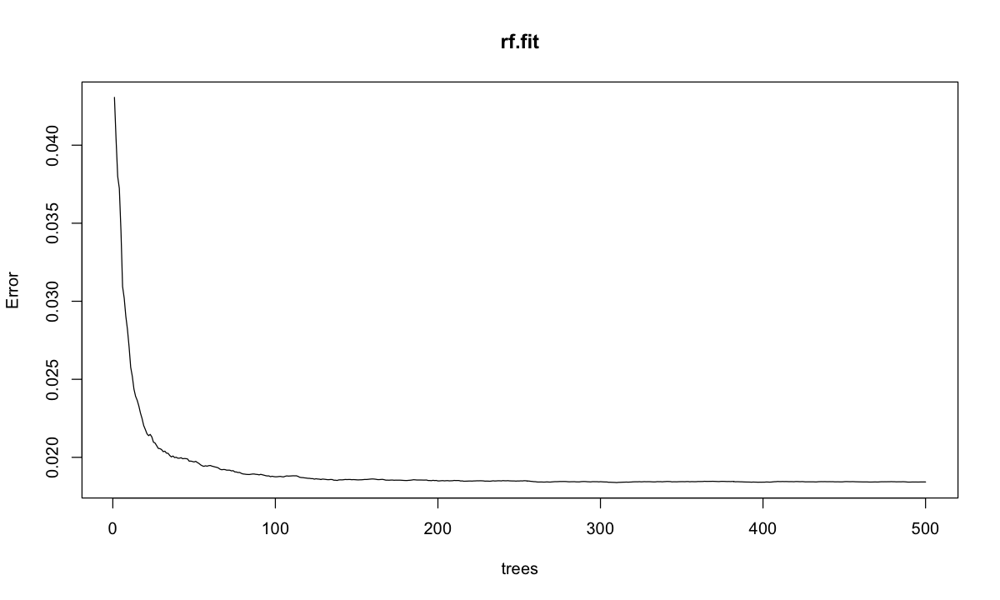

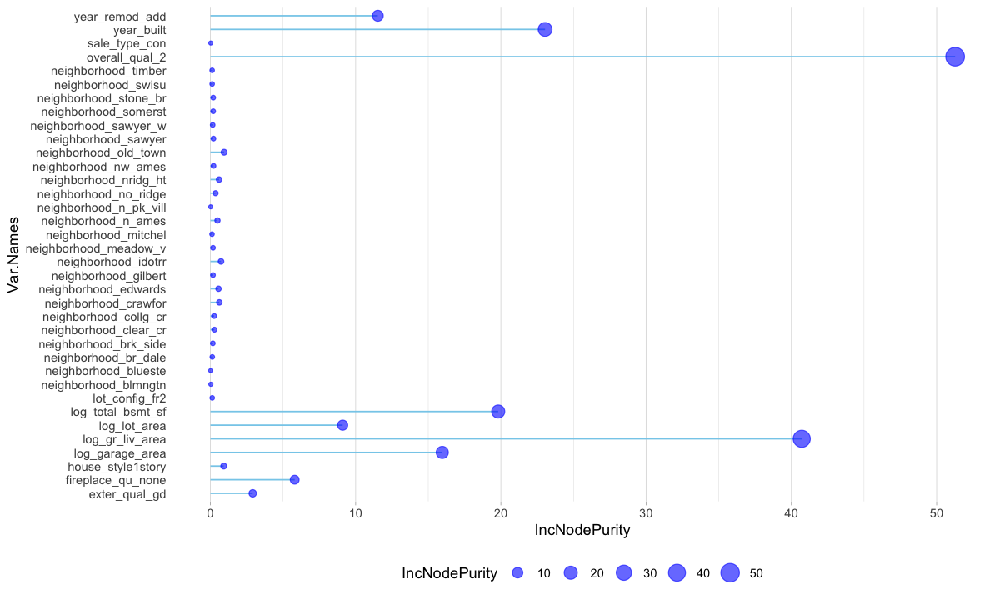

In [51]:
# Non-Parametric model
library(randomForest)
library(ggplot2)
set.seed(1234)

predictor_vars <- c(
  "log_gr_liv_area", "log_lot_area", "overall_qual_2", "year_built", "year_remod_add",
  "log_total_bsmt_sf", "log_garage_area", "lot_config_fr2", "house_style1story", "exter_qual_gd",
  "fireplace_qu_none", "sale_type_con"#, ". -sale_price" #Can include "." to make really complex
) %>% paste(collapse = " * ")
neighborhood_vars <- grep("neighborhood", colnames(train), value = TRUE) %>% paste(collapse = " + ")
terms <- (paste(predictor_vars, neighborhood_vars, sep = " * "))
formula <- as.formula(paste("log_sale_price ~", terms, "- neighborhood_veenker"))
library(dplyr)

#removing rows with infinity in one of the values

df <- train[!is.infinite(rowSums(train)),]

rf.fit <- randomForest(formula, data = df,ntree=500)


#prediction on test case
df_test <- test[,!is.na(colSums(test))]
df_test <- df_test[!is.infinite(rowSums(df_test)),]


df_test['sale_price'] <- predict(rf.fit, newdata= df_test)

print(rf.fit)

plot(rf.fit)

## Visualize variable importance ----------------------------------------------

# Get variable importance from the model fit
ImpData <- as.data.frame(importance(rf.fit))
ImpData$Var.Names <- row.names(ImpData)

ggplot(ImpData, aes(x=Var.Names, y=`IncNodePurity`)) +
  geom_segment( aes(x=Var.Names, xend=Var.Names, y=0, yend=`IncNodePurity`), color="skyblue") +
  geom_point(aes(size = IncNodePurity), color="blue", alpha=0.6) +
  theme_light() +
  coord_flip() +
  theme(
    legend.position="bottom",
    panel.grid.major.y = element_blank(),
    panel.border = element_blank(),
    axis.ticks.y = element_blank()
  )


The more complex linear regression model improved on the interpretable linear regression and the random forest further improved on that. The increase in predictive power, however, comes at the cost of interpretability of the model. The complex linear regression could be interpreted with some effort, but the random forest is closer to a black box that can only be used for prediction.


## Conclusion

The first objective was to build a linear regression to explain some of the variation in Sale Price of homes in the Ames, IA dataset. We showed that it is possible to build a linear regression that is useful for interpreting the effects of variables of interest, but that this type of model was not the best choice for predictive accuracy. We recommend this type of model for a person who is interested in understanding the effects of variables on housing sale prices, but not necessarily for predicting the sale price of a home. For example, the could be very useful for a developer who is deciding what features to include in a new development.

The second objective was to build a model that would be useful for predicting the sale price of homes in the Ames, IA dataset. We showed that a random forest model was the best choice for predictive accuracy, but that this model was not useful for interpreting the effects of variables of interest. A more complex linear regression model provides a compromise of both ends of the spectrum. Which model to use depends on the needs of the user. We recommend the random forest model for a person who is interested in predicting the sale price of a home without needing to understand the effects of variables. For example, this could be very useful for a real estate agent who is trying to price a home for sale.

The scope of inference for this work is limited to house prices in Ames, IA during the time period this data was taken. Housing markets are very localized and can change drastically with time. Nonetheless, we believe the models to be generalizeable provided they are trained on data from the target population. Because it is an observational study, no causation can be implied. With more time or computing power, the authors believe there is room to fit even more complex models. For example, a complex linear regression including interaction terms in order to capture non-linear effects of variables. Or a random forest model with more trees and more variables.